# Senior Thesis  <a id="isc_isfc_wkflow"></a>
Much of this notebook builds on brainIAK tutorial notebooks as well as my previous work in NEU/ELE 480 as well as builds upon Dr. Meir Meshulam's previous work with this data set, his sugestions for data wrangling, and other publicly available ISC/ISFC related notebooks.

Kumar, M., Anderson, M. J., Antony, J. W., Baldassano, C., Brooks, P. P., Cai, M. B., Chen, P.-H. C., Ellis, C. T., Henselman-Petrusek, G., Huberdeau, D., Hutchinson, J. B., Li, P. Y., Lu, Q., Manning, J. R., Mennen, A. C., Nastase, S. A., Richard, H., Schapiro, A. C., Schuck, N. W., Shvartsman, M., Sundaraman, N., Suo, D., Turek, J. S., Turner, D. M., Vo, V. A., Wallace, G., Wang, Y., Williams, J. A., Zhang, H., Zhu, X., Capota, M., Cohen, J. D., Hasson, U., Li, K., Ramadge, P. J., Turk-Browne, N. B., Willke, T. L., & Norman, K. A. (2021). BrainIAK: The Brain Imaging Analysis Kit. Aperture Neuro, 1(4). https://doi.org/10.52294/31bb5b68-2184-411b-8c00-a1dacb61e1da

## Notebook Outline <a id="outline"></a>
1. [**Set up directories**](#setting_directories)
2. [**Loading data**](#load_isc_bold)
3. [**Initial ISC**](#initial_pieman_isc)
4. [**Comparing ISC**](#comparing_iscs)
5. [**Correcting ISC**](#correcting_iscs)
6. [**Parcellate BOLD data**](#parcellate)
7. [**Functional connectivity**](#fc)
8. [**ISFC**](#isfc)
9. [**Comparing WSFC to ISFC**](#fc_isfc)
10. [**Seed-Based ISFC with FDR correction**](#seed_based)
11. [**ISFC comparisons**](#compare_isfc)


In [3]:
%autosave 10
import warnings
import sys 
if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
import os 
from os import listdir, makedirs, walk, remove, getlogin, rename, system, sep, getcwd
from os.path import join, exists, isfile, getmtime, isdir
import glob
import time 
from copy import deepcopy

# Import fMRI and general analysis libraries
import nibabel as nib
import numpy as np
import scipy.io
from scipy import stats
from scipy.stats import norm, zscore, pearsonr, sem
from scipy.signal import gaussian, convolve
import scipy.spatial.distance as sp_distance
from scipy.spatial.distance import squareform
import sklearn as sk
from sklearn.svm import NuSVC, LinearSVC
from sklearn import decomposition
from sklearn.model_selection import LeaveOneOut, KFold
from sklearn.metrics import balanced_accuracy_score
import pandas as pd
import deepdish as dd

# Import plotting library
import seaborn as sns
sns.set(style = 'white', context='poster', rc={"lines.linewidth": 2.5})
sns.set(palette="colorblind")
import matplotlib.pyplot as plt
%matplotlib inline 
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as patches

# Import machine learning libraries
import nilearn as nii
from nilearn.plotting import view_img,  plot_epi, show
from nilearn import datasets
from nilearn.image import load_img, math_img,index_img, resample_img, resample_to_img
from nilearn.input_data import NiftiMasker, NiftiLabelsMasker
from nilearn import datasets
from nilearn import surface
from nilearn import image
from nilearn.masking import apply_mask
from nilearn import plotting
from nilearn.plotting import view_img, plot_glass_brain, plot_anat, plot_epi, view_img_on_surf, plot_roi,show
from nilearn.input_data import NiftiMasker, NiftiLabelsMasker
from nltools.mask import expand_mask, roi_to_brain
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold, GridSearchCV, PredefinedSplit
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.feature_selection import VarianceThreshold, f_classif, SelectKBest
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

# Load helper functions from NEU/ELE 480 utils files. Some may not be necessary
from utils import mask_data
from utils import raider_data_dir, load_vdc_mask, load_vdc_epi_data, load_vdc_masked_data 
from utils import vdc_data_dir, vdc_all_ROIs, vdc_label_dict, vdc_n_runs, vdc_hrf_lag, vdc_TR, vdc_TRs_run # load some constants

# Import brainIAK library
from brainiak import image, io
import brainiak.utils
from brainiak.isc import isc, isfc, permutation_isc, phaseshift_isc, timeshift_isc, squareform_isfc
from brainiak.fcma.util import compute_correlation
import brainiak.funcalign.srm

Autosaving every 10 seconds


## Data Wrangling  Protocol <a id="data_wrangling_protocol"></a>
1. I first resampled the fMRI output. Resampling is shown in onlineL_data_wrangling_resampling.ipynb and is based on Meir's function found in "pilot fmriprep data transform 1.938 voxels to 2mm (meir).ipynb"
2. Then I smooth the data, shown in onlineL_data_wrangling_smoothing.ipynb
3. Then I load the resulting images (found in the folder "smoothed") and gather the bold data. Then, I trimmed extra wait TRs. This was also performed in onlineL_data_wrangling_smoothing.ipynb
4. I saved the trimmed data as images(found in the folder "trimmed")
5. Then, the images are ready to be multi-masked with BrainIAK functions.

##  Setting up directories  <a id="setting_directories"></a>


In [27]:
data_dir= f'/mnt/cup/labs/hasson/daniellacohen/seniorResearch/derivatives/fmriprep'
mask_dir= f'/mnt/cup/labs/hasson/daniellacohen/seniorResearch/masks'
results_path = '/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/'
ref = os.path.join(mask_dir,'Schaefer2018_200Parcels_7Networks_order_FSLMNI152_2mm.nii.gz') # this is the Schaefer atlas, used for 
sub_ids = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21']
tasks = ['piemanVid', 'cosVid', 'histVid', 'piemanQA', 'cosQA', 'histQA'] # only video portions were used in this analysis

this atlas has shape: (91, 109, 91)


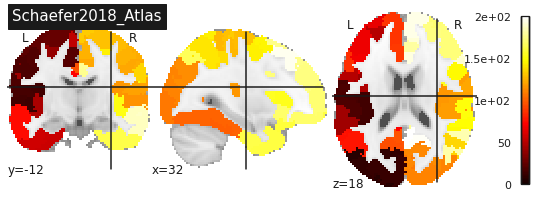

In [537]:
print("this atlas has shape:", nib.load(ref).shape)
plotting.plot_stat_map(nib.load(ref), title = "Schaefer2018_Atlas")

##  Load in Bold Data for ISC<a id="load_isc_bold"></a>
The data to run an ISC must be masked beforehand. This was done above using brainIAK's multimask function.
Note that I show work to save the data and saved files now have the same name.

In [11]:
piemanVid_bold = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/final_piemanVid_bold.npy')
cosVid_bold = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/final_cosVid_bold.npy')
histVid_bold = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/final_histVid_bold.npy')

In [95]:
print("the piemanVid bold data has shape:", piemanVid_bold.shape)
print("the cosVid bold data has shape:", cosVid_bold.shape)
print("the histVid bold data has shape:", histVid_bold.shape)

the piemanVid bold data has shape: (280, 228483, 21)
the cosVid bold data has shape: (272, 228483, 21)
the histVid bold data has shape: (346, 228483, 21)


In [ ]:
# Investigate voxel time courses

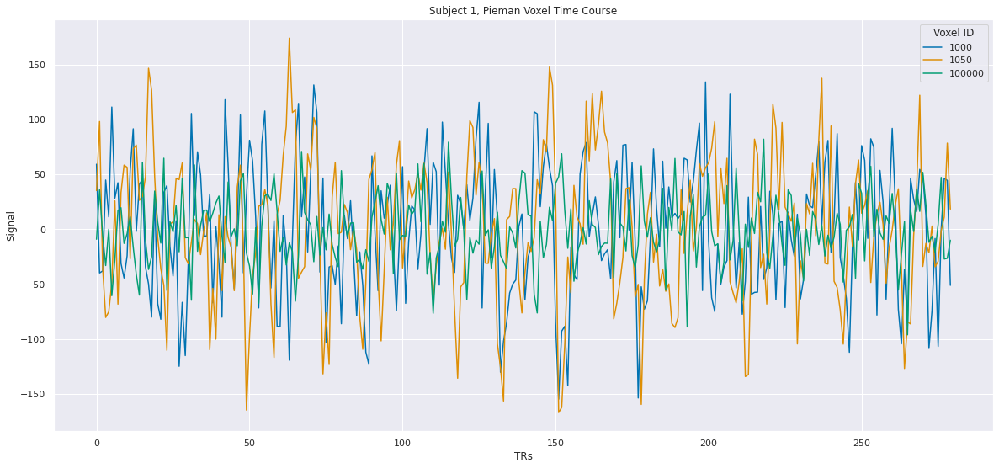

In [129]:
f,ax = plt.subplots(1,1,figsize=(20,9))
ax.plot(piemanVid_bold[:,(999,1049,99999),0]);
ax.set_title("Subject 1, Pieman Voxel Time Course")
ax.set_xlabel("TRs")
ax.set_ylabel("Signal")
ax.legend(["1000", "1050", "100000"] , title = "Voxel ID")

Text(0.5, 1.0, 'single voxel timecourse for participant 1')

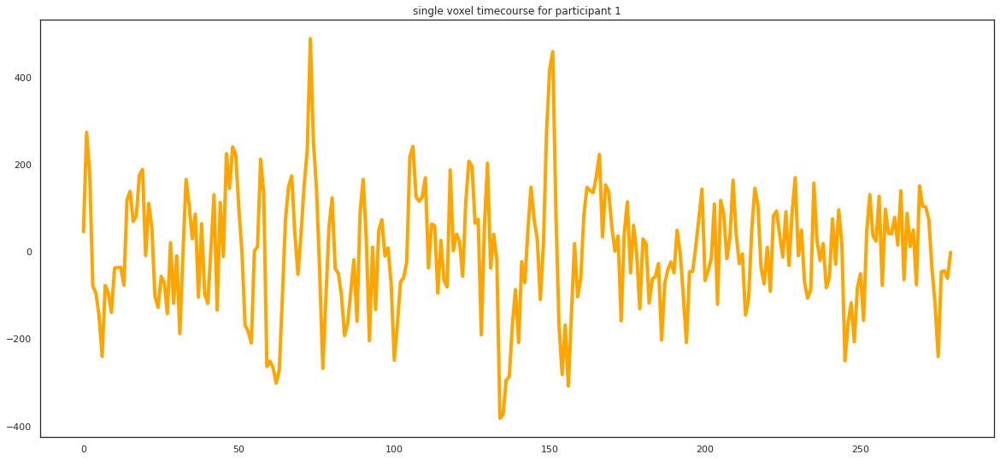

In [679]:
f,ax = plt.subplots(1,1,figsize=(20,9))
ax.plot(piemanVid_bold[:,(9999),0], lw = 4, color = "orange");
ax.set_title("single voxel timecourse for participant 1")

# Loading Harvard-Oxford Parcellated Data <a id="load_ho"></a>
The data was parcellated using the Harvard-Oxford Atlas. Work for this is later in the notebook "Parcellate with Harvard_Oxford"

In [7]:
piemanVid_bold_ho = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/piemanVid_bold_ho.npy')
cosVid_bold_ho = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/cosVid_bold_ho.npy')
histVid_bold_ho = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/histVid_bold_ho.npy')

In [94]:
print("the piemanVid parcellated bold data has shape:", piemanVid_bold_ho.shape)
print("the cosVid parcellated bold data has shape:", cosVid_bold_ho.shape)
print("the histVid parcellated bold data has shape:", histVid_bold_ho.shape)

the piemanVid parcellated bold data has shape: (280, 96, 21)
the cosVid parcellated bold data has shape: (272, 96, 21)
the histVid parcellated bold data has shape: (346, 96, 21)


# Loading Uncorrected ISC Maps

In [91]:
piemanVid_isc_map = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/isc/ISC_piemanVid_uncorrected.npy')
cosVid_isc_map = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/isc/ISC_cosVid_uncorrected.npy')
histVid_isc_map = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/isc/ISC_histVid_uncorrected.npy')

# Loading in the whole brain mask

In [9]:
# Whole brain mask downloaded from neurovault, previously used neurosynth, but website periodically went down
# NOTE: in exploratory work, I loaded individual mask files, and named whole_brain_bool_mask or ev_bool_mask (early visual)

# Get the mask file
mask_name = f'/mnt/cup/labs/hasson/daniellacohen/seniorResearch/masks/MNI152_T1_2mm_brain_mask.nii.gz'

# Load the brain mask
brain_mask = io.load_boolean_mask(mask_name)

# Get the list of nonzero voxel coordinates
coords = np.where(brain_mask)

# Load the brain nii image
brain_nii = nib.load(mask_name)

print('This mask has shape:', brain_nii.shape)

This mask has shape: (91, 109, 91)


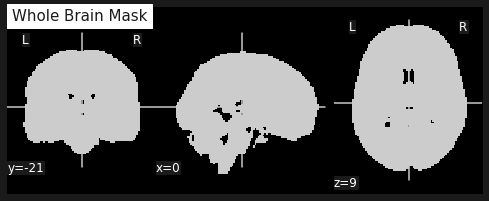

In [542]:
plotting.plot_epi(brain_nii, title = 'Whole Brain Mask')

# Loading trimmed filenames

In [11]:
def trimmed_fnames(task):
    
     """Loads in the trimmed filenames 
    -------

    task : string of task name


    Returns
    -------

    fnames : the filenames

    Notes
    -------
    Trimmed files were:
    1. Resampled in "onlineL_data_wrangling_resampling.ipynb" (based on Meir Meshulam's function, found in "pilot fmriprep data transform 1.938 voxels to 2mm (meir).ipynb")
    2. Smoothed with FWHM = 6mm found in "onlineL_data_wrangling_scotty_smoothing.ipynb"
    3. Trimmed to remove extra wait times and TRs

    """
    fnames = []
    for i in sub_ids: # sub_ids loaded in directories code block
        fname = os.path.join(data_dir, 'trimmed_data/trimmed_2mm_sub_%s_%s.nii.gz' % (i, task))
        fnames.append(fname)
    return fnames

In [575]:
trimmed_piemanVid_fnames = trimmed_fnames('piemanVid')
trimmed_cosVid_fnames = trimmed_fnames('cosVid')
trimmed_histVid_fnames = trimmed_fnames('histVid')
print("pieman file list contains this many files files:", len(trimmed_piemanVid_fnames))

pieman file list contains this many files files: 21


# Masking the data using BrainIAK

In [576]:
# Masking for pieman filenames
# Adapted from final project for NEU/ELE 480
piemanVid_images = {}
piemanVid_masked_images = {}
piemanVid_bold = {} 

piemanVid_images = io.load_images(trimmed_piemanVid_fnames)  
piemanVid_masked_images = image.mask_images(piemanVid_images, brain_mask)
# Concatenate all of the masked images across participants  
piemanVid_bold = image.MaskedMultiSubjectData.from_masked_images(piemanVid_masked_images, len(trimmed_piemanVid_fnames))
piemanVid_bold[np.isnan(piemanVid_bold)] = 0
print("the shape of piemanVid bold data is", np.shape(piemanVid_bold))

the shape of piemanVid bold data is (280, 228483, 21)


In [577]:
# Masking for computer science filenames
cosVid_images = {}
cosVid_masked_images = {}
cosVid_bold = {} 

cosVid_images = io.load_images(trimmed_cosVid_fnames)  
cosVid_masked_images = image.mask_images(cosVid_images, brain_mask)
# Concatenate all of the masked images across participants  
cosVid_bold = image.MaskedMultiSubjectData.from_masked_images(cosVid_masked_images, len(trimmed_cosVid_fnames))
cosVid_bold[np.isnan(cosVid_bold)] = 0
print("the shape of cosVid bold data is", np.shape(cosVid_bold))

the shape of cosVid bold data is (272, 228483, 21)


In [578]:
# Masking for history filenames
histVid_images = {}
histVid_masked_images = {}
histVid_bold = {} 

histVid_images = io.load_images(trimmed_histVid_fnames)  
histVid_masked_images = image.mask_images(histVid_images, brain_mask)
# Concatenate all of the masked images across participants  
histVid_bold = image.MaskedMultiSubjectData.from_masked_images(histVid_masked_images, len(trimmed_histVid_fnames))
histVid_bold[np.isnan(histVid_bold)] = 0
print("the shape of histVid bold data is", np.shape(histVid_bold))

the shape of histVid bold data is (346, 228483, 21)


In [579]:
print("the bold data is of type:", type(piemanVid_bold), "and has shape:", np.shape(piemanVid_bold), "(TRxVoxelsxSubjects)")

the bold data is of type: <class 'brainiak.image.MaskedMultiSubjectData'> and has shape: (280, 228483, 21) (TRxVoxelsxSubjects)


In [26]:
# make bold_data into arrays 
final_piemanVid_bold = np.asarray(piemanVid_bold)
final_cosVid_bold = np.asarray(cosVid_bold)
final_histVid_bold = np.asarray(histVid_bold)

# save for easy import
dir_out = results_path + 'final_bold_data/'
bold_piemanVid_map_path = os.path.join(dir_out, 'final_piemanVid_bold.npy')
np.save(bold_piemanVid_map_path, final_piemanVid_bold)

bold_cosVid_map_path = os.path.join(dir_out, 'final_cosVid_bold.npy')
np.save(bold_cosVid_map_path, final_cosVid_bold)

bold_histVid_map_path = os.path.join(dir_out, 'final_histVid_bold.npy')
np.save(bold_histVid_map_path, final_histVid_bold)

In [ ]:
# can load the data that is saved, as done below, under the new name, or can use the same name to skip the masking

##  Initial Pieman Video ISC<a id="initial_pieman_isc"></a>
This is a raw ISC. Tests of statistical significance will be run to correct maps. Takes ~20 mins.

In [50]:
piemanVid_isc_map = brainiak.isc.isc(piemanVid_bold, pairwise=False)
print(piemanVid_isc_map.shape)

(21, 228483)


In [56]:
# I will use the isc_dir_out moving forward for ISC related output
# note that results_path is set at the beginning of the notebook
isc_dir_out = results_path + 'isc/'
pieman_isc_map_path_uncorrected = os.path.join(isc_dir_out, 'ISC_piemanVid_uncorrected.npy')
np.save(pieman_isc_map_path_uncorrected, piemanVid_isc_map)

In [ ]:
# ISC for one subject

# Set params 
subj_id = 0

# Make the ISC output a volume
piemanVid_isc_vol_1sub = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
# Coords come from brain_mask
piemanVid_isc_vol_1sub[coords] = piemanVid_isc_map[subj_id, :]
# Make a nii image of the isc map 
piemanVid_isc_nifti_1sub = nib.Nifti1Image(piemanVid_isc_vol_1sub, brain_nii.affine, brain_nii.header)

In [ ]:
#Plot the data as a statmap
threshold = .2

f, ax = plt.subplots(1,1, figsize = (12, 5))
plotting.plot_stat_map(
    piemanVid_isc_nifti_1sub, 
    threshold=threshold, 
    axes=ax
)
ax.set_title('Pieman ISC Subject 1')

In [155]:
# Repeat for mean ISC
# Make the ISC output a volume
piemanVid_isc_vol = np.zeros(brain_nii.shape)
# Take mean and map the ISC data into brain space
piemanVid_isc_vol[coords] = np.mean(piemanVid_isc_map, axis = 0)
# Make a nii image  
piemanVid_mean_isc_nifti = nib.Nifti1Image(piemanVid_isc_vol, brain_nii.affine, brain_nii.header)

In [ ]:
results_path = '/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/'

In [ ]:
# Path is set above
# Note that this is only in 2D. For 3D, make surface texture
isc_map_path = os.path.join(isc_dir_out, 'meanISC_piemanVid.2d.nii.gz')
nib.save(piemanVid_mean_isc_nifti, isc_map_path)

Text(0.5, 1.0, 'Smoothed Average ISC map for piemanVid for all subs')

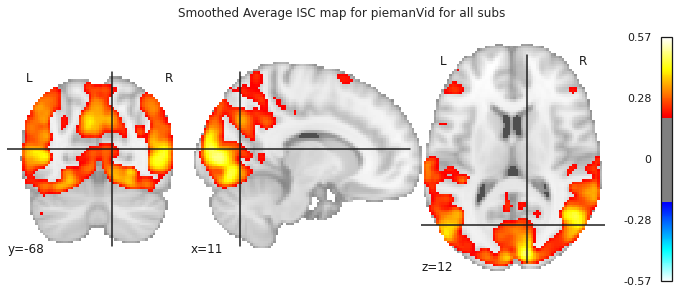

In [320]:
thresh = .2

f, ax = plt.subplots(1,1, figsize = (12, 5))
plotting.plot_stat_map(
    piemanVid_mean_isc_nifti, 
    threshold=thresh, 
    axes=ax
#   , display_mode = 'y'
)
ax.set_title('Smoothed Average ISC map for piemanVid for all subs') 

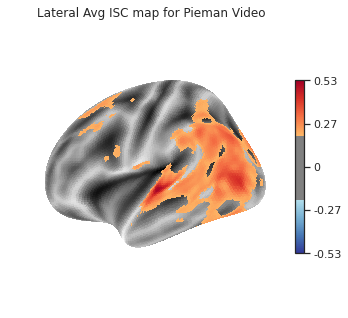

In [321]:
fsaverage = datasets.fetch_surf_fsaverage()
mean_piemanVid_texture = surface.vol_to_surf(piemanVid_mean_isc_nifti , fsaverage.pial_left)

thresh = .2 
view = 'lateral'

# plot 
title_text = ('Lateral Avg ISC map for Pieman Video')
surf_map = plotting.plot_surf_stat_map(
    fsaverage.infl_left, mean_piemanVid_texture, 
    hemi='left', view=view, 
    title= title_text, 
    threshold=thresh, cmap='RdYlBu_r', 
    colorbar=True,
    bg_map=fsaverage.sulc_left)

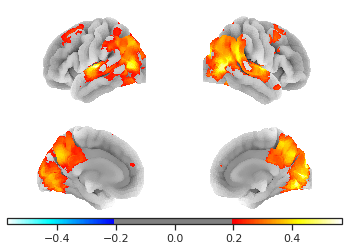

In [322]:
thresh = .2

plotting.plot_img_on_surf(piemanVid_mean_isc_nifti,
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          threshold = thresh,
                          colorbar=True)
plotting.show()

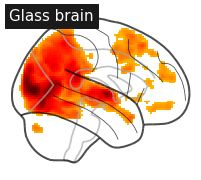

In [323]:
plotting.plot_glass_brain(piemanVid_mean_isc_nifti, display_mode='r', plot_abs=False,
                          title='Glass brain', threshold=.2)

In [327]:
# view = plotting.view_img_on_surf(piemanVid_mean_isc_nifti, threshold='0%', colorbar_height=0.4)
# view.open_in_browser()

# view

##  Initial Computer Science Video ISC<a id="initial_cos_isc"></a>
This is a raw ISC. Tests of statistical significance will be run to correct maps. This took ~25 mins

In [60]:
cosVid_isc_map = brainiak.isc.isc(cosVid_bold, pairwise=False)

In [65]:
cosVid_isc_map_loaded.shape

(21, 228483)

In [67]:
cosVid_isc_map[3,30000]

0.1783901709218677

In [68]:
cosVid_isc_map_loaded[3,30000]

0.1783901709218677

In [66]:
cosVid_isc_map_loaded.shape

(21, 228483)

In [63]:
isc_dir_out = results_path + 'isc/'
# Results path is set above
cos_isc_map_path_uncorrected = os.path.join(isc_dir_out, 'ISC_cosVid_uncorrected.npy')
np.save(cos_isc_map_path_uncorrected, cosVid_isc_map)

In [64]:
cosVid_isc_map_loaded = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/isc/ISC_cosVid_uncorrected.npy')

In [329]:
# Make the ISC output a volume
cosVid_isc_vol = np.zeros(brain_nii.shape)
# Coords come from brain_mask
cosVid_isc_vol[coords] = np.mean(cosVid_isc_map, axis = 0)
# make a nii image of the isc map 
cosVid_mean_isc_nifti = nib.Nifti1Image(cosVid_isc_vol, brain_nii.affine, brain_nii.header)


In [ ]:
# save
# path is set above
isc_map_path = os.path.join(dir_out, 'meanISC_cosVid.2d.nii.gz')
nib.save(cosVid_mean_isc_nifti, isc_map_path)

Text(0.5, 1.0, 'Smoothed Average ISC map for cosVid for all subs')

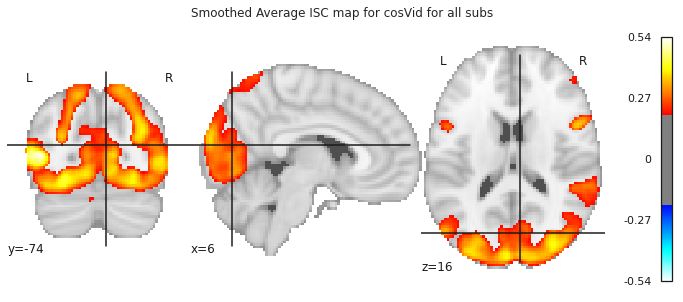

In [330]:
thresh = .2
smooth_mm = 6

f, ax = plt.subplots(1,1, figsize = (12, 5))
plotting.plot_stat_map(
    cosVid_mean_isc_nifti, 
    threshold=thresh, 
    axes=ax
#   , display_mode = 'y'
)
ax.set_title('Smoothed Average ISC map for cosVid for all subs') 

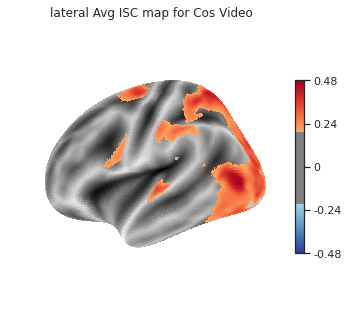

In [331]:
#lateral
fsaverage = datasets.fetch_surf_fsaverage()
mean_cosVid_texture = surface.vol_to_surf(cosVid_mean_isc_nifti , fsaverage.pial_left)

thresh = .2 
view = 'lateral'

# plot 
title_text = ('%s Avg ISC map for Cos Video' % (view))
surf_map = plotting.plot_surf_stat_map(
    fsaverage.infl_left, mean_cosVid_texture, 
    hemi='left', view=view, 
    title= title_text, 
    threshold=thresh, cmap='RdYlBu_r', 
    colorbar=True,
    bg_map=fsaverage.sulc_left)

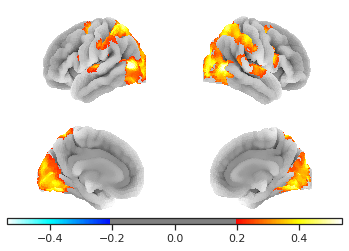

In [332]:
thresh = .2

plotting.plot_img_on_surf(cosVid_mean_isc_nifti,
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          threshold = thresh,
                          colorbar=True)
plotting.show()

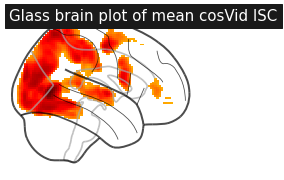

In [333]:
plotting.plot_glass_brain(cosVid_mean_isc_nifti, display_mode='r', plot_abs=False,
                          title='Glass brain plot of mean cosVid ISC', threshold=.2)

In [336]:
# thresh = "90%" 
# mean_cosVid_texture = surface.vol_to_surf(cosVid_mean_isc_nifti, fsaverage.pial_left)

# view = plotting.view_surf(fsaverage.infl_left, mean_cosVid_texture, 
#                           bg_map=fsaverage.sulc_left, threshold = thresh)
# view

In [ ]:
# view = plotting.view_img_on_surf(cosVid_mean_isc_nifti, threshold='0%')
# # view.open_in_browser()

# view

##  Initial History Video ISC<a id="initial_hist_isc"></a>
This is a raw ISC. Tests of statistical significance will be run to correct maps. Took ~25 mins

In [85]:
histVid_isc_map = brainiak.isc.isc(histVid_bold, pairwise=False)

In [590]:
histVid_isc_map.shape

(21, 228483)

In [86]:
isc_dir_out = results_path + 'isc/'
# Results path is set above
hist_isc_map_path_uncorrected = os.path.join(isc_dir_out, 'ISC_histVid_uncorrected.npy')
np.save(hist_isc_map_path_uncorrected, histVid_isc_map)

In [338]:
# Make the ISC output a volume
histVid_isc_vol = np.zeros(brain_nii.shape)
# Coords come from brain_mask
histVid_isc_vol[coords] = np.mean(histVid_isc_map, axis = 0)
# make a nii image of the isc map 
histVid_mean_isc_nifti = nib.Nifti1Image(histVid_isc_vol, brain_nii.affine, brain_nii.header)

In [ ]:
isc_map_path = os.path.join(isc_dir_out, 'meanISC_histVid.2d.nii.gz')
nib.save(histVid_mean_isc_nifti, isc_map_path)

Text(0.5, 1.0, 'Average ISC map for histVid for all subs')

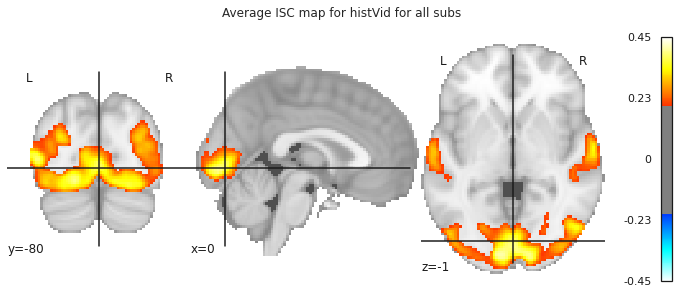

In [339]:
thresh = .2

f, ax = plt.subplots(1,1, figsize = (12, 5))
plotting.plot_stat_map(
    histVid_mean_isc_nifti, 
    threshold=thresh, 
    axes=ax
#   , display_mode = 'y'
)
ax.set_title('Average ISC map for histVid for all subs') 

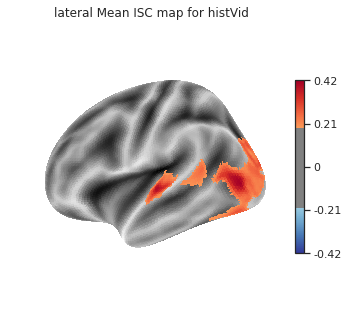

In [340]:
fsaverage = datasets.fetch_surf_fsaverage()
mean_histVid_texture = surface.vol_to_surf(histVid_mean_isc_nifti , fsaverage.pial_left)

thresh = .2 
view = 'lateral'

# plot 
title_text = ('%s Mean ISC map for histVid' % (view))
surf_map = plotting.plot_surf_stat_map(
    fsaverage.infl_left, mean_histVid_texture, 
    hemi='left', view=view, 
    title= title_text, 
    threshold=thresh, cmap='RdYlBu_r', 
    colorbar=True,
    bg_map=fsaverage.sulc_left)

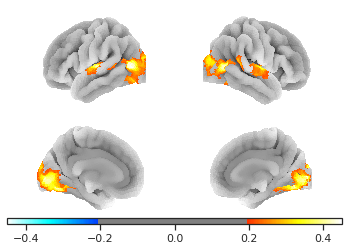

In [341]:
thresh = .2

plotting.plot_img_on_surf(histVid_mean_isc_nifti,
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          threshold = thresh,
                          colorbar=True)
plotting.show()

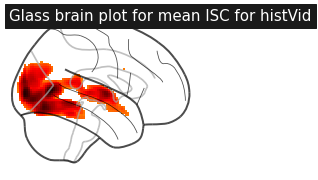

In [342]:
plotting.plot_glass_brain(histVid_mean_isc_nifti, display_mode='r', plot_abs=False,
                          title='Glass brain plot for mean ISC for histVid', threshold=.2)

In [ ]:
# thresh = "90%" 
# mean_histVid_texture = surface.vol_to_surf(histVid_mean_isc_nifti, fsaverage.pial_left)

# view = plotting.view_surf(fsaverage.infl_left, mean_histVid_texture, 
#                           bg_map=fsaverage.sulc_left, threshold = thresh)
# view

In [ ]:
# view = plotting.view_img_on_surf(histVid_mean_isc_nifti, threshold='0%')
# # view.open_in_browser()

# view

##  Comparing Raw ISCs <a id="comparing_iscs"></a>
Performed a t test and FDR corrected those p values to zero out non significant p values corresponding to voxels between the ISC maps

In [75]:
pieman_cos_isc = piemanVid_isc_map -cosVid_isc_map

In [174]:
pieman_hist_isc = piemanVid_isc_map -histVid_isc_map

In [175]:
cos_hist_isc = cosVid_isc_map -histVid_isc_map

In [203]:
t_pieman_cos_isc, p_pieman_cos_isc = stats.ttest_rel(piemanVid_isc_map,cosVid_isc_map)

In [204]:
t_pieman_hist_isc, p_pieman_hist_isc = stats.ttest_rel(piemanVid_isc_map,histVid_isc_map)

In [205]:
t_cos_hist_isc, p_cos_hist_isc = stats.ttest_rel(cosVid_isc_map,histVid_isc_map)

In [281]:
fdr_corrected_bool_pvals_pieman_cos_isc, fdr_corrected_pvals_pieman_cos_isc = fdr_correction(p_pieman_cos_isc, alpha=0.005, method='indep')
print("out of 228483 voxels, this many are significant:", np.sum(fdr_corrected_bool_pvals_pieman_cos_isc))

out of 228483 voxels, this many are significant: 28702


In [262]:
fdr_corrected_bool_pvals_pieman_hist_isc, fdr_corrected_pvals_pieman_hist_isc = fdr_correction(p_pieman_hist_isc, alpha=0.005, method='indep')
print("for pieman - hist, out of 228483 voxels, this many are significant:", np.sum(fdr_corrected_bool_pvals_pieman_hist_isc))

for pieman - hist, out of 228483 voxels, this many are significant: 58099


In [263]:
fdr_corrected_bool_pvals_cos_hist_isc, fdr_corrected_pvals_cos_hist_isc = fdr_correction(p_cos_hist_isc, alpha=0.005, method='indep')
print("for cos - hist, out of 228483 voxels, this many are significant:", np.sum(fdr_corrected_bool_pvals_cos_hist_isc))

for cos - hist, out of 228483 voxels, this many are significant: 24696


In [277]:
corrected_mean_pieman_cos_isc_voxels = np.mean(pieman_cos_isc, axis = 0)
for i in range(len(fdr_corrected_pvals_pieman_cos_isc)):
    if fdr_corrected_pvals_pieman_cos_isc[i] == False:
        corrected_mean_pieman_cos_isc_voxels[i] = 0

In [278]:
# Make the ISC output a volume
corrected_pieman_cos_isc_vol = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
corrected_pieman_cos_isc_vol[coords] = corrected_mean_pieman_cos_isc_voxels
# make a nii image of the isc map 
corrected_pieman_cos_mean_isc_nifti = nib.Nifti1Image(corrected_pieman_cos_isc_vol, brain_nii.affine, brain_nii.header)

In [266]:
corrected_mean_pieman_hist_isc_voxels = np.mean(pieman_hist_isc, axis = 0)
for i in range(len(fdr_corrected_pvals_pieman_hist_isc)):
    if fdr_corrected_pvals_pieman_hist_isc[i] == False:
        corrected_mean_pieman_hist_isc_voxels[i] = 0

In [267]:
# Make the ISC output a volume
corrected_pieman_hist_isc_vol = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
corrected_pieman_hist_isc_vol[coords] = corrected_mean_pieman_hist_isc_voxels
# make a nii image of the isc map 
corrected_pieman_hist_mean_isc_nifti = nib.Nifti1Image(corrected_pieman_hist_isc_vol, brain_nii.affine, brain_nii.header)

In [268]:
corrected_mean_cos_hist_isc_voxels = np.mean(cos_hist_isc, axis = 0)
for i in range(len(fdr_corrected_pvals_cos_hist_isc)):
    if fdr_corrected_pvals_cos_hist_isc[i] == False:
        corrected_mean_cos_hist_isc_voxels[i] = 0

In [269]:
# Make the ISC output a volume
corrected_cos_hist_isc_vol = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
corrected_cos_hist_isc_vol[coords] = corrected_mean_cos_hist_isc_voxels
# make a nii image of the isc map 
corrected_cos_hist_mean_isc_nifti = nib.Nifti1Image(corrected_cos_hist_isc_vol, brain_nii.affine, brain_nii.header)

In [317]:
# thresh = "0%"

# view_img_on_surf(corrected_cos_hist_mean_isc_nifti,
#                  surf_mesh="fsaverage",              
#                  threshold=thresh,
#                  symmetric_cmap=False,
#                  cmap='coolwarm',
#                  title = 'CS - Hist ISC',
#                  vmax = .25
#                 # vol_to_surf_kwargs={"n_samples": 1, "radius": 0.0, "interpolation": "nearest"}
#                 )

##  Correcting ISC maps: Bootstrap <a id="correcting_iscs"></a>
Create a bootstrap distribution. From documentation: returns observed ISC, confidence interval, and a p value for the bootstrap hypothesis test, as well as the bootstrap distribution of summary statistics. We will use the p values generated from brainIAK's bootstrap ISC function, FDR correct the p values to correct for multiple comparisons, and use resulting q values to correct the ISC maps

In [592]:
# Note the same function is used in ISFC correction as well 
# Note that pvalues from bootstrap must be corrected for multuple comparisons
# I will use FDR, but am showing bootstrap p values for demonstrative purposes
def count_pvals(pvals):
    count = 0
    for i in range(len(pvals)):
        if pvals[i] < .05:
            count = count + 1 
    return count

In [160]:
piemanVid_observed, piemanVid_ci, piemanVid_p, piemanVid_distribution = brainiak.isc.bootstrap_isc(piemanVid_isc_map, pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)
print("the shape of the piemanVid P values is", piemanVid_p.shape)
print("the shape of the piemanVid distribution is", piemanVid_distribution.shape)
print("bootstrap ISC yields", count_pvals(piemanVid_p),"significant voxels out of", len(piemanVid_p))

the shape of the piemanVid P values is (228483,)
the shape of the piemanVid distribution is (1000, 228483)
bootstrap ISC yields 187884 significant voxels out of 228483


In [161]:
cosVid_observed, cosVid_ci, cosVid_p, cosVid_distribution = brainiak.isc.bootstrap_isc(cosVid_isc_map, pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)
print("the shape of the cosVid P values is", cosVid_p.shape)
print("the shape of the cosVid distribution is", cosVid_distribution.shape)
print("bootstrap ISC yields", count_pvals(cosVid_p),"significant voxels out of", len(cosVid_p))

the shape of the cosVid P values is (228483,)
the shape of the cosVid distribution is (1000, 228483)
bootstrap ISC yields 159793 significant voxels out of 228483


In [162]:
histVid_observed, histVid_ci, histVid_p, histVid_distribution = brainiak.isc.bootstrap_isc(histVid_isc_map, pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)
print("the shape of the histVid P values is", histVid_p.shape)
print("the shape of the histVid distribution is", histVid_distribution.shape)
print("bootstrap ISC yields", count_pvals(histVid_p),"significant voxels out of", len(histVid_p))

the shape of the histVid P values is (228483,)
the shape of the histVid distribution is (1000, 228483)
bootstrap ISC yields 115991 significant voxels out of 228483


Text(0.5, 1.0, 'pieman bootstrap distribution')

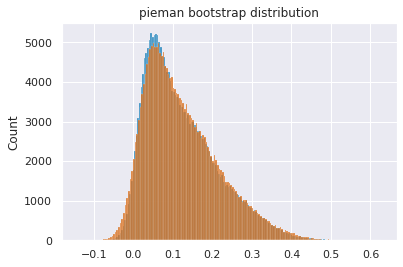

In [596]:
bootstrap_id = 0
sns.histplot(piemanVid_observed, label = "observed")
sns.histplot(piemanVid_distribution[bootstrap_id, :], color = "r", label = "bootstrap distribution").set_title('pieman bootstrap distribution')

##  FDR correction <a id="fdr"></a>


In [71]:
def _ecdf(x):

    nobs = len(x)

    return np.arange(1, nobs + 1) / float(nobs)

In [72]:
def fdr_correction(pvals, alpha=0.05, method='indep'):

    """P-value correction with False Discovery Rate (FDR).
    Correction for multiple comparison using FDR.
    This covers Benjamini/Hochberg for independent or positively correlated and
    Benjamini/Yekutieli for general or negatively correlated tests.

    Parameters
    ----------

    pvals : array_like

        set of p-values of the individual tests.

    alpha : float

        error rate

    method : 'indep' | 'negcorr'

        If 'indep' it implements Benjamini/Hochberg for independent or if

        'negcorr' it corresponds to Benjamini/Yekutieli.

    Returns
    -------

    reject : array, bool

        True if a hypothesis is rejected, False if not

    pval_corrected : array

        pvalues adjusted for multiple hypothesis testing to limit FDR

    Notes
    -----

    Reference:

    Genovese CR, Lazar NA, Nichols T.

    Thresholding of statistical maps in functional neuroimaging using the false

    discovery rate. Neuroimage. 2002 Apr;15(4):870-8.

    """

    pvals = np.asarray(pvals)

    shape_init = pvals.shape

    pvals = pvals.ravel()

    pvals_sortind = np.argsort(pvals)

    pvals_sorted = pvals[pvals_sortind]

    sortrevind = pvals_sortind.argsort()

    if method in ['i', 'indep', 'p', 'poscorr']:

        ecdffactor = _ecdf(pvals_sorted)

    elif method in ['n', 'negcorr']:

        cm = np.sum(1. / np.arange(1, len(pvals_sorted) + 1))

        ecdffactor = _ecdf(pvals_sorted) / cm

    else:

        raise ValueError("Method should be 'indep' and 'negcorr'")


    reject = pvals_sorted < (ecdffactor * alpha)

    if reject.any():

        rejectmax = max(np.nonzero(reject)[0])

    else:

        rejectmax = 0

    reject[:rejectmax] = True
 
    pvals_corrected_raw = pvals_sorted / ecdffactor

    pvals_corrected = np.minimum.accumulate(pvals_corrected_raw[::-1])[::-1]

    pvals_corrected[pvals_corrected > 1.0] = 1.0

    pvals_corrected = pvals_corrected[sortrevind].reshape(shape_init)

    reject = reject[sortrevind].reshape(shape_init)

    return reject, pvals_corrected

In [489]:
# Note that alpha = 0.05 for all three videos. It is possible to use a more rigerous alpha = 0.01

##  piemanVid FDR correction


In [163]:
piemanVid_fdr = fdr_correction(piemanVid_p, alpha=0.05, method='indep')
print("the total voxels in piemanVid are", piemanVid_fdr[0].shape, "and there are this many significant ones", np.sum(piemanVid_fdr[0]))

the total voxels in piemanVid are (228483,) and there are this many significant ones 185247


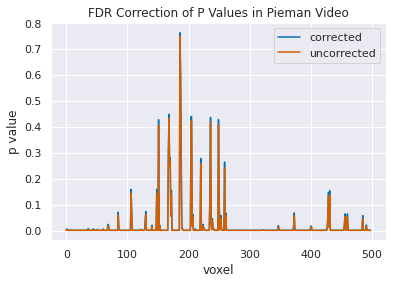

In [602]:
plt.plot(piemanVid_fdr[1][1:500], c = "b", label = 'corrected')
plt.plot(piemanVid_p[1:500], c = 'r', label = "uncorrected")
plt.title('FDR Correction of P Values in Pieman Video')
plt.ylabel('p value')
plt.xlabel('voxel')
plt.legend()

In [164]:
# Correct the map using FDR q values
# Take the mean ISC map and zero out the insignificant voxels
corrected_mean_piemanVid_isc_voxels = np.mean(piemanVid_isc_map, axis = 0)
for i in range(len(piemanVid_fdr[0])):
    if piemanVid_fdr[0][i] == False:
        corrected_mean_piemanVid_isc_voxels[i] = 0

In [165]:
# Make the ISC output a volume
corrected_piemanVid_isc_vol = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
corrected_piemanVid_isc_vol[coords] = corrected_mean_piemanVid_isc_voxels
# make a nii image of the isc map 
corrected_piemanVid_mean_isc_nifti = nib.Nifti1Image(corrected_piemanVid_isc_vol, brain_nii.affine, brain_nii.header)

Text(0.5, 1.0, 'Smoothed and FDR Corrected Average ISC map for piemanVid for all subs')

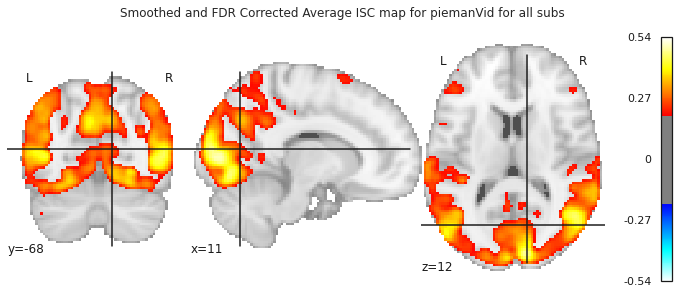

In [344]:
thresh = .2

f, ax = plt.subplots(1,1, figsize = (12, 5))
plotting.plot_stat_map(
    corrected_piemanVid_mean_isc_nifti, 
    threshold=thresh, 
    axes=ax,
    vmax = .54
#   , display_mode = 'y'
 )
ax.set_title('Smoothed and FDR Corrected Average ISC map for piemanVid for all subs') 

In [231]:
#view = plotting.view_img_on_surf(corrected_piemanVid_mean_isc_nifti, threshold='0%', vmax=0.5, title='PiemanVid ISC Right Hemisphere, Sagittal')
# view.open_in_browser()

#view

##  cosVid FDR correction 


In [166]:
cosVid_fdr = fdr_correction(cosVid_p, alpha=0.05, method='indep')
print("the total voxels in cosVid are", cosVid_fdr[0].shape, "and there are this many significant ones", np.sum(cosVid_fdr[0]))

the total voxels in cosVid are (228483,) and there are this many significant ones 155181


In [167]:
corrected_mean_cosVid_isc_voxels = np.mean(cosVid_isc_map, axis = 0)
for i in range(len(cosVid_fdr[0])):
    if cosVid_fdr[0][i] == False:
        corrected_mean_cosVid_isc_voxels[i] = 0

In [168]:
# Make the ISC output a volume
corrected_cosVid_isc_vol = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
corrected_cosVid_isc_vol[coords] = corrected_mean_cosVid_isc_voxels
# make a nii image of the isc map 
corrected_cosVid_mean_isc_nifti = nib.Nifti1Image(corrected_cosVid_isc_vol, brain_nii.affine, brain_nii.header)

Text(0.5, 1.0, 'Smoothed and FDR Corrected Average ISC map for cosVid for all subs')

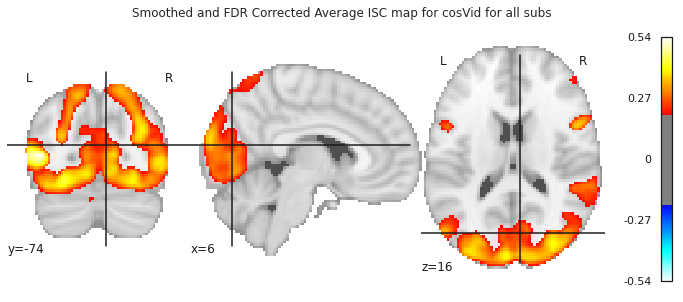

In [345]:
thresh = .2

f, ax = plt.subplots(1,1, figsize = (12, 5))
plotting.plot_stat_map(
    corrected_cosVid_mean_isc_nifti, 
    threshold=thresh, 
    axes=ax
#   , display_mode = 'y'
)
ax.set_title('Smoothed and FDR Corrected Average ISC map for cosVid for all subs') 

In [263]:
# view = plotting.view_img_on_surf(corrected_cosVid_mean_isc_nifti, threshold='0%', vmax=0.5, title = 'cosVid ISC Left Hemisphere, Sagittal')
# view
# #view.open_in_browser()

##  histVid FDR correction


In [169]:
histVid_fdr = fdr_correction(histVid_p, alpha=0.05, method='indep')
print("the total voxels in histVid are", histVid_fdr[0].shape, "and there are this many significant ones", np.sum(histVid_fdr[0]))

the total voxels in histVid are (228483,) and there are this many significant ones 110425


In [170]:
corrected_mean_histVid_isc_voxels = np.mean(histVid_isc_map, axis = 0)
for i in range(len(histVid_fdr[0])):
    if histVid_fdr[0][i] == False:
        corrected_mean_histVid_isc_voxels[i] = 0

In [171]:
# Make the ISC output a volume
corrected_histVid_isc_vol = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
corrected_histVid_isc_vol[coords] = corrected_mean_histVid_isc_voxels
# make a nii image of the isc map 
corrected_histVid_mean_isc_nifti = nib.Nifti1Image(corrected_histVid_isc_vol, brain_nii.affine, brain_nii.header)

In [192]:
isc_dir_out = results_path + 'isc/'
# Results path is set above

pieman_isc_map_path_corrected_img = os.path.join(isc_dir_out, 'ISC_piemanVid_corrected.nii.gz')
nib.save(corrected_piemanVid_mean_isc_nifti, pieman_isc_map_path_corrected_img)

cos_isc_map_path_corrected_img = os.path.join(isc_dir_out, 'ISC_cosVid_corrected.nii.gz')
nib.save(corrected_cosVid_mean_isc_nifti, cos_isc_map_path_corrected_img)

hist_isc_map_path_corrected_img = os.path.join(isc_dir_out, 'ISC_histVid_corrected.nii.gz')
nib.save(corrected_histVid_mean_isc_nifti, hist_isc_map_path_corrected_img)

Text(0.5, 1.0, 'Smoothed and FDR Corrected Average ISC map for histVid for all subs')

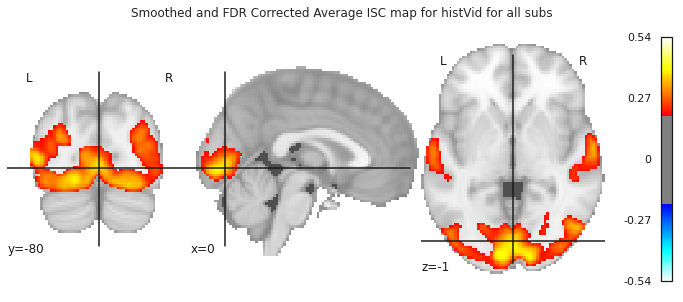

In [346]:
thresh = .2

f, ax = plt.subplots(1,1, figsize = (12, 5))
plotting.plot_stat_map(
    corrected_histVid_mean_isc_nifti, 
    threshold=thresh., 
    axes=ax,
    vmax = .54
#   , display_mode = 'y'
)
ax.set_title('Smoothed and FDR Corrected Average ISC map for histVid for all subs') 

In [662]:
# view = plotting.view_img_on_surf(corrected_histVid_mean_isc_nifti, threshold='0%', vmax=0.5, title = 'histVid ISC Left Hemisphere, Sagittal')
# view.open_in_browser()

# view

##  Permutation test <a id="permutation_test"></a>
Perform a permutation test to find significant voxels. From documentation: permutation_isc permutes group assignments to construct a permutation distribution. Returns observed ISC, permutation-based p values and permutation distribution 

In [611]:
isc_vid_maps = [(piemanVid_isc_map), (cosVid_isc_map), (histVid_isc_map)]

In [614]:
# Concatenate ISCs from both tasks
isc_maps_all_vids = np.vstack(isc_vid_maps)

# Print('group_assignment: {}'.format(group_assignment))
print('isc_maps_all_vids: {}' .format(np.shape(isc_maps_all_vids)))
#print('group_assignment:' ,group_assignment)

isc_maps_all_vids: (63, 228483)


In [615]:
# Permutation testing with brainIAK tutorial #10 protocol
n_permutations = 1000
summary_statistic='median'

observed, p, distribution = permutation_isc(
    piemanVid_isc_map, 
    pairwise=False,
#    group_assignment=group_assignment, 
    summary_statistic=summary_statistic,
    n_permutations=n_permutations
)

In [ ]:
perm_id = 0
sns.histplot(observed, label = "observed")
sns.histplot(distribution[perm_id, :], color = "r", label = "perm distribution")

In [ ]:
fig,ax = plt.subplots()

for i in range(len(p)):
    if p[i] < .05:
        ax.plot(i, p[i],".", color='r', zorder = 10)
        
ax.set_xlabel('Neuron #')
ax.set_ylabel('p value')
ax.set_title('Statistically Significant Voxels')
print("there are this many stastically significant voxels", count_pvals(p))

From NEU/ELE 480: The logic of the permutation is to test the null hypothesis: the observed responses could just have been due to chance and are therefore meaningless. In the plot above, we see that the blue plot is the observed condition and it is far away (not on top of) the red plot, which is the permutation test from the null distribution. Because the observed and the permuted are far away, we can reject the null hypothesis. Threfore, the observed responses are meaningful and not just due to chance. The p values still need to be corrected for multiple comparisons, which I will perform in the coming sections.

Instead of doing bootstrap ISC, I could have used this permutation_isc to then FDR correct p values and then zero out non-significant voxels and correct my ISC maps, however bootstrsap is reccomended to be the best option for such analyses

##  Parcellate with Harvard_Oxford<a id="parcellate"></a>

Number of parcels:	 96


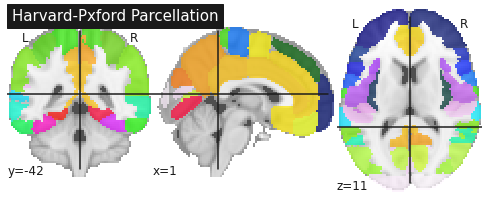

In [15]:
# load a parcel
atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm', symmetric_split=True)
plotting.plot_roi(atlas.maps, title='Harvard-Pxford Parcellation')

n_regions = len(atlas.labels)-1 # rm background region 
print('Number of parcels:\t {}'.format(n_regions))

In [87]:
def parcellate_ho(n_subjs, n_TRs, fnames):
    # Adapted from NEU/ELE 480 
    # Get a masker for the atlas 
    masker_ho = NiftiLabelsMasker(labels_img=atlas.maps)

    # Transform the data to the parcel space
    bold_ho = np.zeros((n_TRs, n_regions, n_subjs))

    # Collect all data 
    row_has_nan = np.zeros(shape=(n_regions,), dtype=bool)

    for subj_id in range(n_subjs):

            # get the data for task t, subject s 
        nii_img = nib.load(fnames[subj_id])
        bold_ho[:,:,subj_id] = masker_ho.fit_transform(nii_img)

            # figure out missing rois 
        row_has_nan_ = np.any(np.isnan(bold_ho[:,:,subj_id]),axis=0)
        row_has_nan[row_has_nan_] = True                

    # Figure out which ROI has missing values
    roi_select = np.logical_not(row_has_nan)
    n_roi_select = np.sum(roi_select)
    rois_filtered = np.array(atlas.labels[1:])[roi_select]
    bold_ho_filtered = np.zeros((n_TRs, n_roi_select, n_subjs)) 

    # Remove ROIs with missing values
    for subj_id in range(n_subjs):
        bold_ho_filtered[:,:,subj_id] = bold_ho[:,roi_select,subj_id]
    return bold_ho_filtered
    print('ROI selected\n {}'.format(rois_filtered))
    print('ROI removed due to missing values :( \n {}'.format(np.array(atlas.labels[1:])[row_has_nan]))

In [21]:
piemanVid_bold_ho = parcellate_ho(21, 280, trimmed_piemanVid_fnames)
print(piemanVid_bold_ho.shape)

In [487]:
cosVid_bold_ho = parcellate_ho(21, 272, trimmed_cosVid_fnames)
print(cosVid_bold_ho.shape)

In [ ]:
histVid_bold_ho = parcellate_ho(21, 346, trimmed_histVid_fnames)
print(histVid_bold_ho.shape)

##  Save Harvard-Oxford Parcellations 
Parcellating the data is time-consuming. Saving the data as npy files is necessary.

In [31]:
dir_out = results_path + 'final_bold_data/'
bold_ho_piemanVid_path = os.path.join(dir_out, 'piemanVid_bold_ho.npy')
np.save(bold_ho_piemanVid_path, piemanVid_bold_ho)

In [32]:
bold_ho_cosVid_path = os.path.join(dir_out, 'cosVid_bold_ho.npy')
np.save(bold_ho_cosVid_path, cosVid_bold_ho)

In [33]:
bold_ho_histVid_path = os.path.join(dir_out, 'histVid_bold_ho.npy')
np.save(bold_ho_histVid_path, histVid_bold_ho)

##  Load Harvard-Oxford Saved Parcellations
Note that this is repeated at the beginning of the notebook.

In [23]:
piemanVid_bold_ho = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/piemanVid_bold_ho.npy')
cosVid_bold_ho = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/cosVid_bold_ho.npy')
histVid_bold_ho = np.load('/mnt/cup/labs/hasson/daniellacohen/seniorResearch/seniorCode/output/final_bold_data/histVid_bold_ho.npy')

##  Functional Connectivity <a id="fc"></a>


In [13]:
# This code is from Sam Nastase
# https://github.com/brainiak/brainiak-aperture/blob/master/notebooks/isc/ISC.ipynb

# Compute mean with Fisher z-transformation
def fisher_mean(correlation, axis=None):
    return np.tanh(np.mean(np.arctanh(correlation), axis=axis))

# Compute within-subject functional connectivity for piemanVid data
piemanVid_fcs = fisher_mean([np.corrcoef(s) for s in piemanVid_bold_ho.T],
                         axis=0)

# Compute within-subject functional connectivity for cosVid data
cosVid_fcs = fisher_mean([np.corrcoef(s) for s in cosVid_bold_ho.T],
                        axis=0)

# Compute within-subject functional connectivity for histVid data
histVid_fcs = fisher_mean([np.corrcoef(s) for s in histVid_bold_ho.T],
                        axis=0)

In [652]:
piemanVid_fcs.shape

(96, 96)

In [654]:
piemanVid_fcs[10,10]

1.0

In [655]:
# the diagonal is always 1

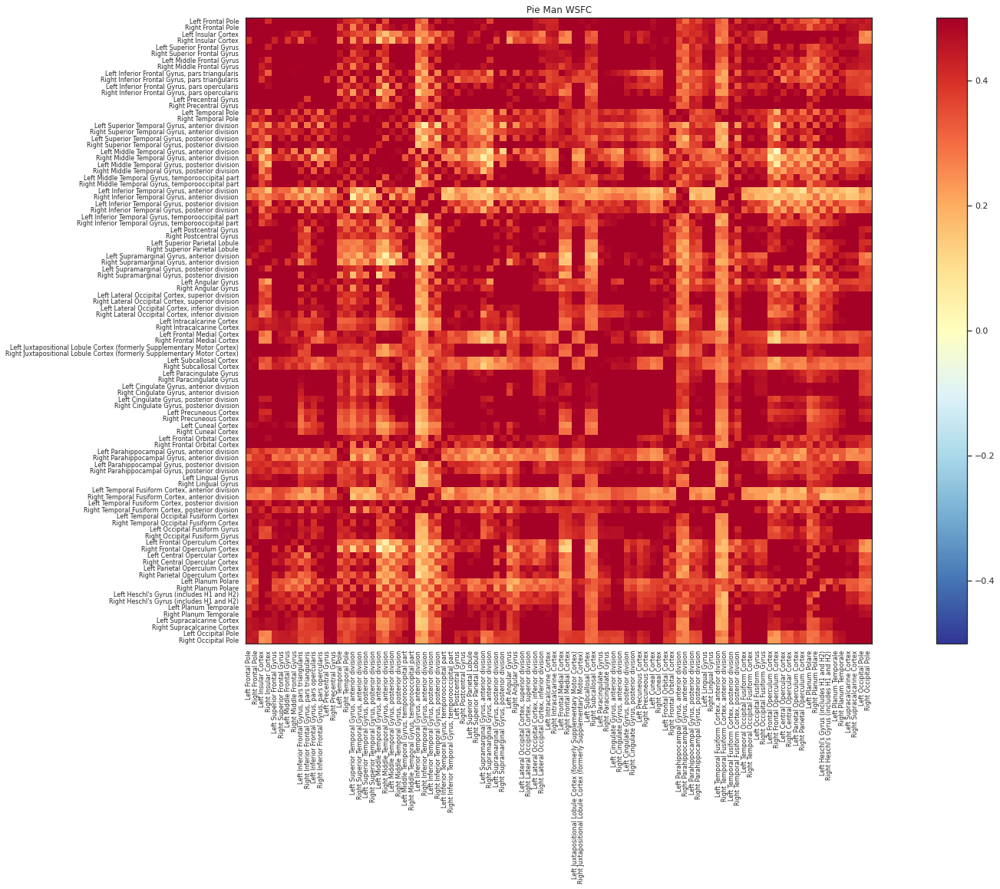

In [397]:
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(piemanVid_fcs, interpolation='None', cmap='RdYlBu_r', vmin = -.5, vmax = .5)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8, rotation='vertical')
ax.set_title("Pie Man WSFC")
f.colorbar(im,ax=ax);

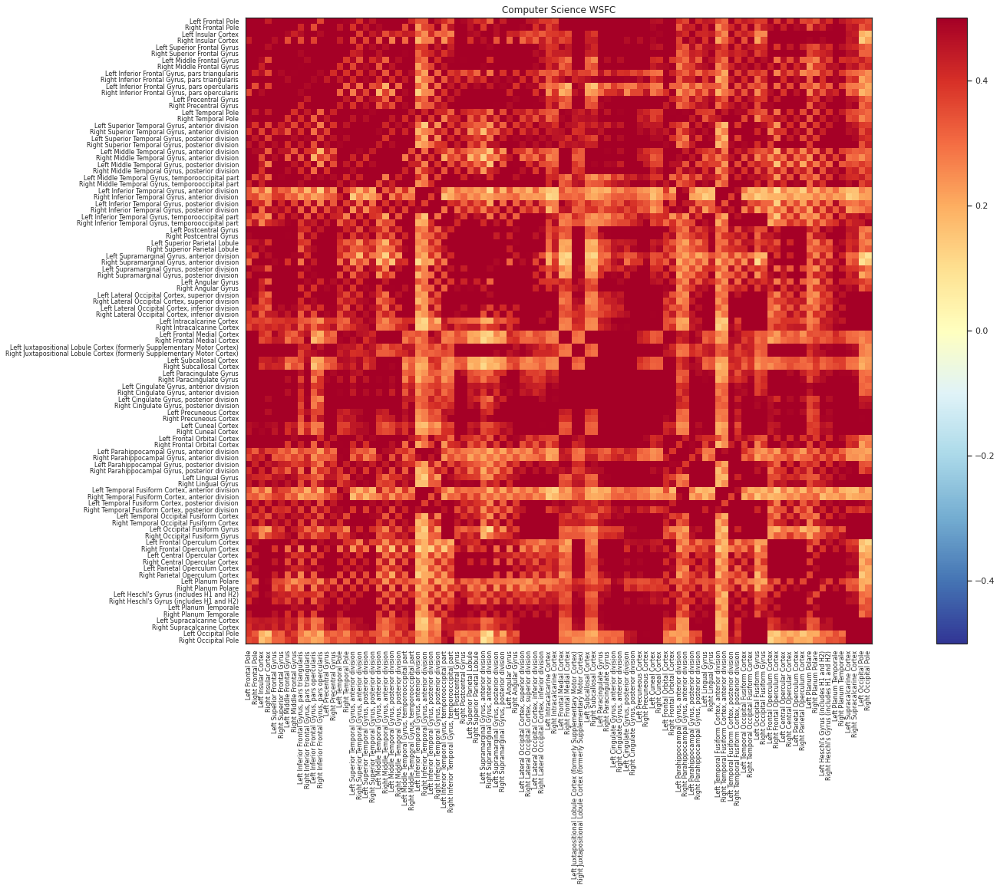

In [398]:
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(cosVid_fcs, interpolation='None', cmap='RdYlBu_r', vmin = -.5, vmax = .5)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8, rotation='vertical')
ax.set_title("Computer Science WSFC")
f.colorbar(im,ax=ax);

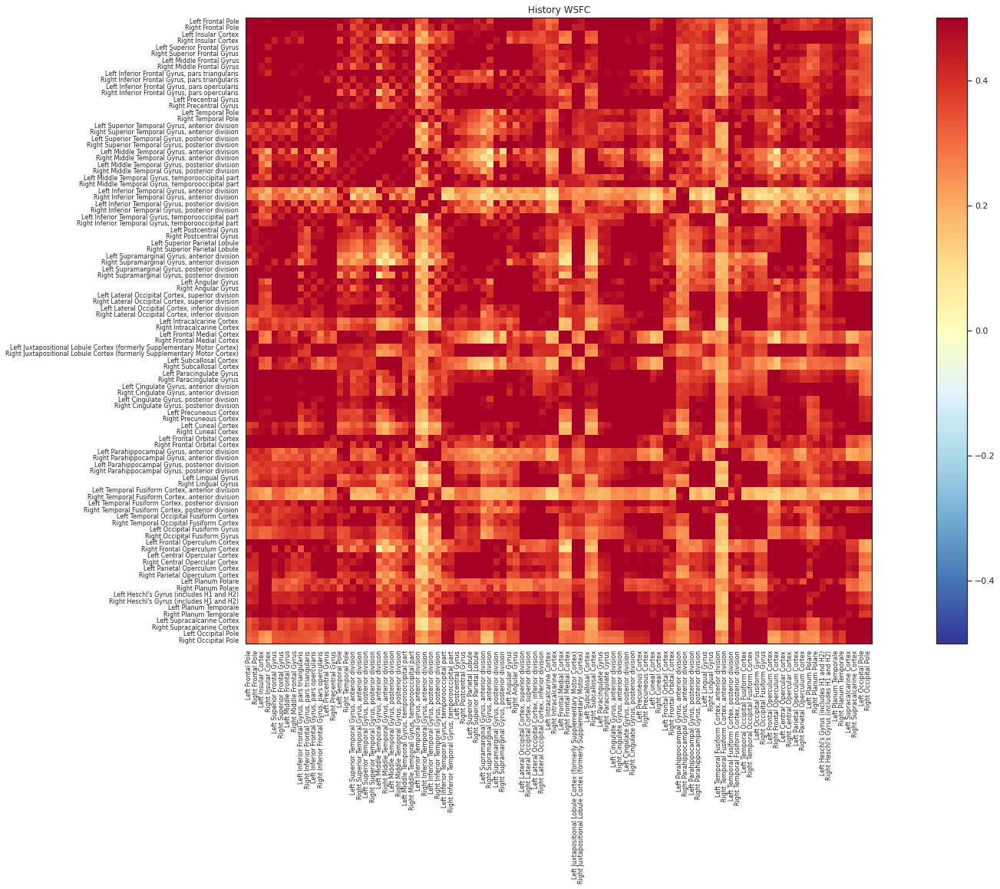

In [399]:
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(histVid_fcs, interpolation='None', cmap='RdYlBu_r', vmin = -.5, vmax = .5)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8, rotation='vertical')
ax.set_title("History WSFC")
f.colorbar(im,ax=ax);

#  Create ISFC Maps <a id="isfc"></a>


###  Pieman Video ISFC


In [135]:
piemanVid_mean_isfc_maps = brainiak.isc.isfc(piemanVid_bold_ho, summary_statistic='median', pairwise = False, vectorize_isfcs=False)   
print("mean pieman ISFC map is:",piemanVid_mean_isfc_maps.shape)
piemanVid_isfc_maps_allsubs = brainiak.isc.isfc(piemanVid_bold_ho, pairwise=False, vectorize_isfcs=False)   
print("per-subject ISFC map is:", piemanVid_isfc_maps_allsubs.shape)

mean pieman ISFC map is: (96, 96)
per-subject ISFC map is: (21, 96, 96)


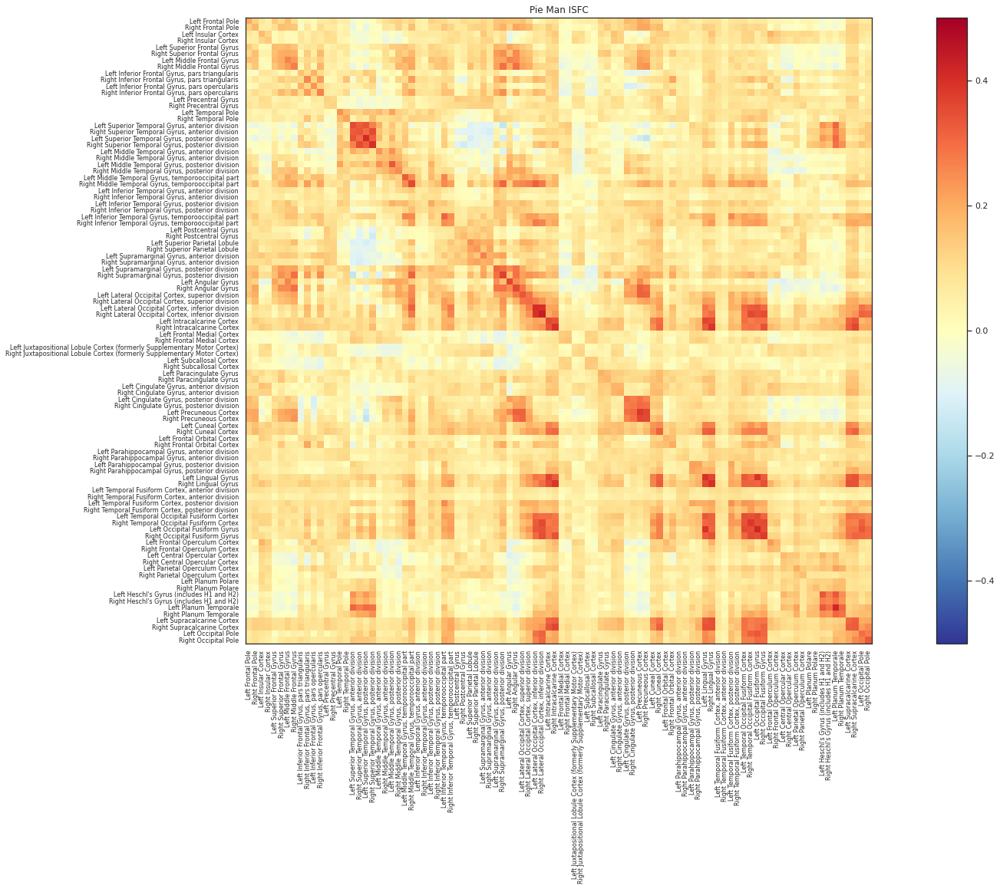

In [586]:
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(piemanVid_mean_isfc_maps, interpolation='None', cmap='RdYlBu_r', vmin = -.5, vmax = .5)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8, rotation='vertical')
ax.set_title("Pie Man ISFC")
f.colorbar(im,ax=ax);

###  Computer Science ISFC


In [18]:
cosVid_mean_isfc_maps = brainiak.isc.isfc(cosVid_bold_ho, summary_statistic='median', pairwise = 'false', vectorize_isfcs=False)   
print("mean computer science ISFC map is:",cosVid_mean_isfc_maps.shape)
cosVid_isfc_maps_allsubs = brainiak.isc.isfc(cosVid_bold_ho, pairwise = False, vectorize_isfcs=False)   
print("per-subject ISFC map is:", cosVid_isfc_maps_allsubs.shape)

mean computer science ISFC map is: (96, 96)
per-subject ISFC map is: (21, 96, 96)


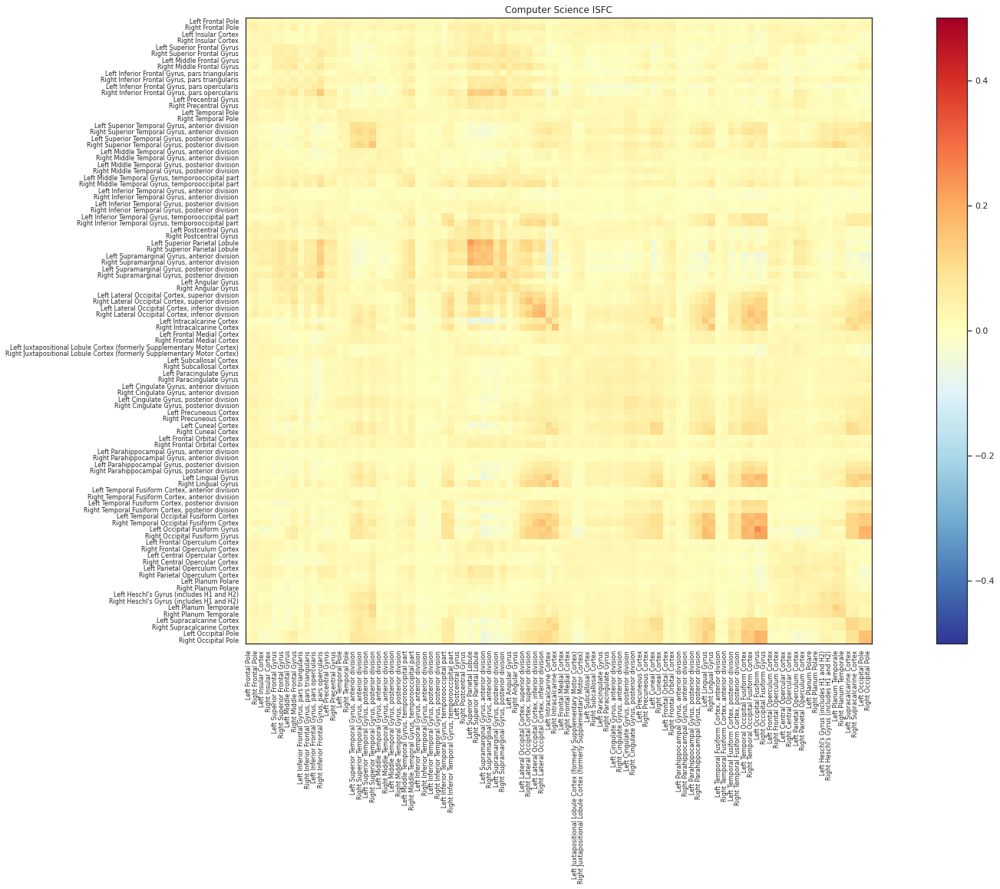

In [587]:
# this is an isfc plot
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(cosVid_mean_isfc_maps, interpolation='None', cmap='RdYlBu_r', vmin = -.5, vmax = .5)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("Computer Science ISFC")
f.colorbar(im,ax=ax);

###  History Video ISFC


In [19]:
histVid_mean_isfc_maps = brainiak.isc.isfc(histVid_bold_ho, summary_statistic='median', pairwise = 'false', vectorize_isfcs=False)   
print("mean history ISFC map is:",histVid_mean_isfc_maps.shape)
histVid_isfc_maps_allsubs = brainiak.isc.isfc(histVid_bold_ho, pairwise = False, vectorize_isfcs=False)   
print("per-subject ISFC map is:", histVid_isfc_maps_allsubs.shape)

mean history ISFC map is: (96, 96)
per-subject ISFC map is: (21, 96, 96)


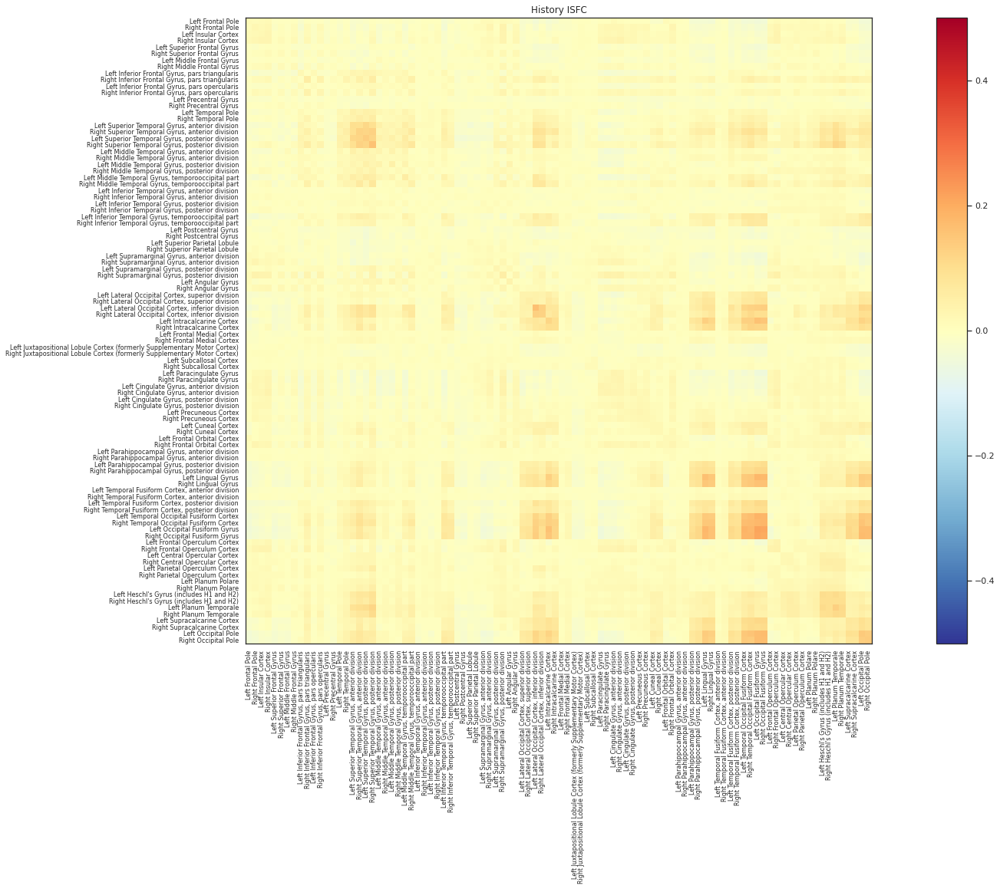

In [588]:
# this is an isfc plot
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(histVid_mean_isfc_maps, interpolation='None', cmap='RdYlBu_r', vmin = -.5, vmax = .5)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("History ISFC")
f.colorbar(im,ax=ax);

##  Comparing WSFC to ISFC <a id="fc_isfc"></a>


In [675]:
# Note that vmax needs to be consistent for this comparison, but needs to be chosen
# so that both matrices are visible
# Also note that the sizes and labeling should be manipulated for legibility 

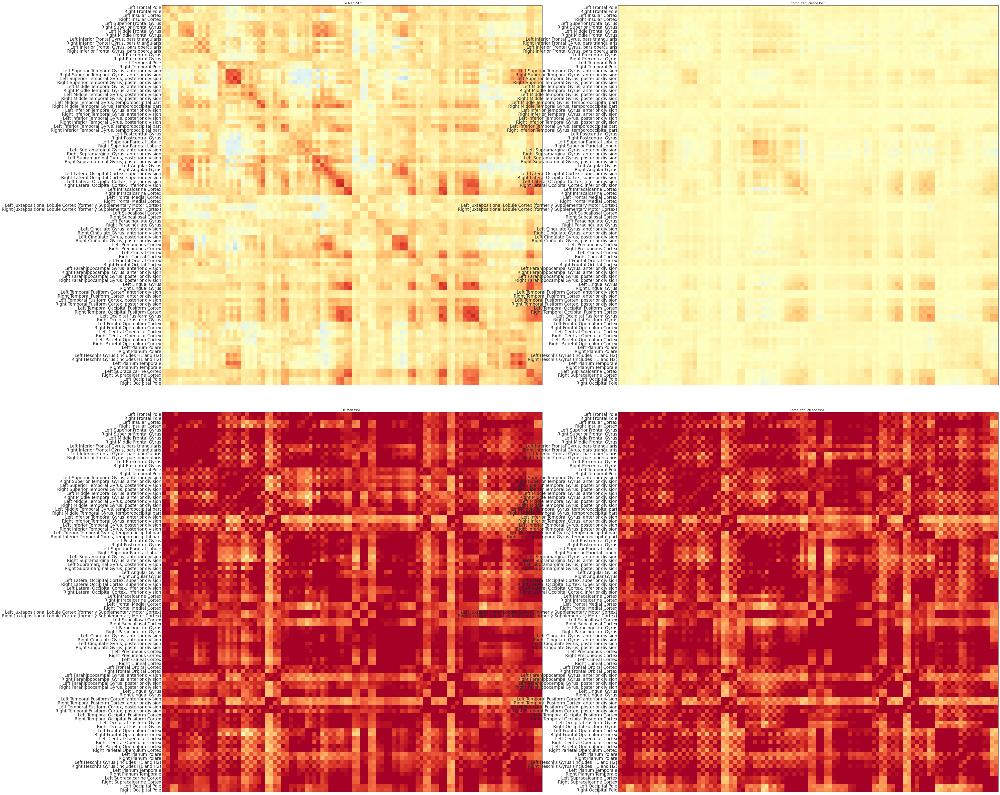

ISFC networks have generally lower correlations than within-subject functional connectivity, but better
differentiate pieman and computer science videos.

Correlation between pieman and computer science ISFC networks: 0.613
Correlation between pieman and computer science WSFC networks: 0.893


In [531]:
from scipy.spatial.distance import squareform
# Visualize ISFC/within-subject functional connectivity (WSFC) matrices for pieman and computer science videos
vmin, vmax = -.5, .5
sns.set_style('white')

fig, axs = plt.subplots(2, 2, figsize=(60, 60))
fc_mats = [piemanVid_mean_isfc_maps, cosVid_mean_isfc_maps, piemanVid_fcs, cosVid_fcs]
fc_titles = ['Pie Man ISFC', 'Computer Science ISFC',
             'Pie Man WSFC', 'Computer Science WSFC']

for ax, fc, t in zip(axs.flatten(), fc_mats, fc_titles):
    ax.matshow(fc, vmax=vmax, vmin=vmin, cmap='RdYlBu_r')
    ax.set_xlabel(t)
    ax.xaxis.set_label_position('top')
    ax.set_xticks([])
    ax.set_yticks(range(len(atlas.labels[1:])))
    ax.set_yticklabels(atlas.labels[1:])
    ax.tick_params(axis='y', which='both', length=0, labelsize=17)
plt.subplots_adjust(hspace=0)
plt.show()

# High correlation between pieman and cos
# for within-subject functional connectivity
fc_r = pearsonr(squareform(piemanVid_fcs, checks=False),
                squareform(cosVid_fcs, checks=False))[0]

# ISFC is more distinct for pieman and cos conditions
isfc_r = pearsonr(squareform(piemanVid_mean_isfc_maps, checks=False),
                  squareform(cosVid_mean_isfc_maps, checks=False))[0]

print("ISFC networks have generally lower correlations than "
      "within-subject functional connectivity, but better\n"
      "differentiate pieman and computer science videos.\n")
print(f"Correlation between pieman and computer science ISFC networks: {isfc_r:.3}")
print(f"Correlation between pieman and computer science WSFC networks: {fc_r:.3}")

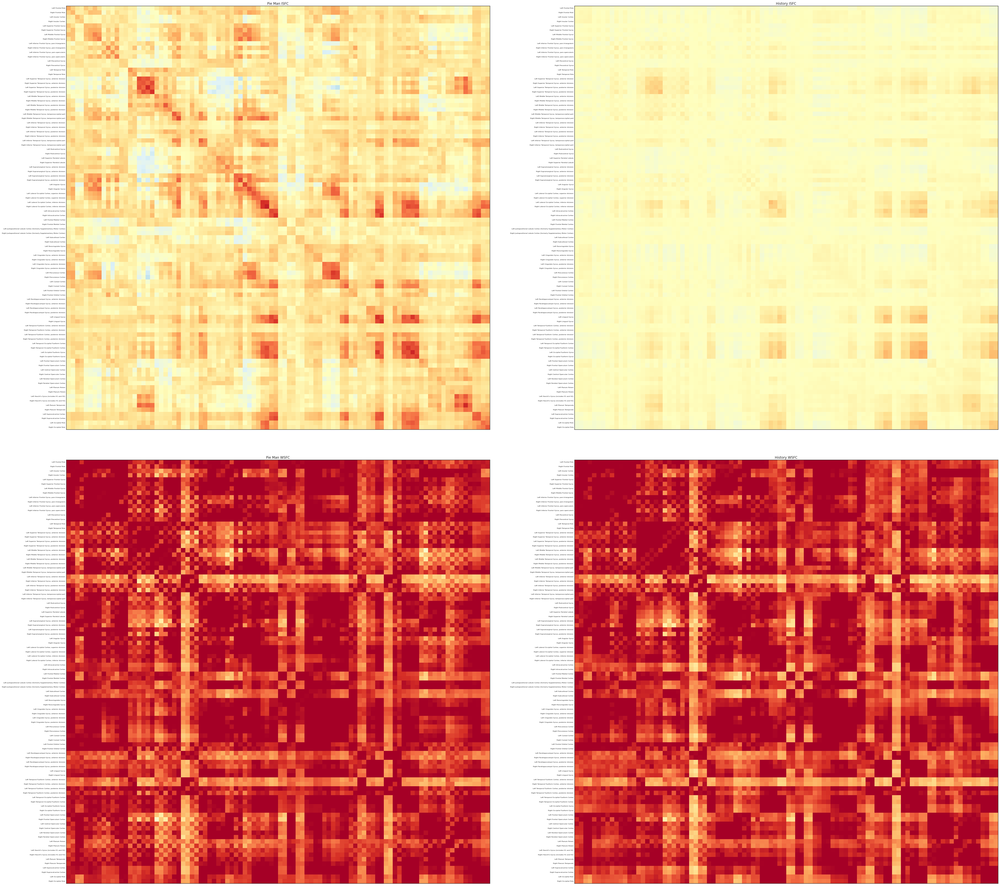

ISFC networks have generally lower correlations than within-subject functional connectivity, but better
differentiate pieman and history videos.

Correlation between pieman and history ISFC networks: 0.552
Correlation between pieman and history WSFC networks: 0.945


In [427]:
from scipy.spatial.distance import squareform
# Visualize ISFC/within-subject functional connectivity (WSFC) matrices for pieman and history videos
vmin, vmax = -.5, .5
sns.set_style('white')

fig, axs = plt.subplots(2, 2, figsize=(60, 60))
fc_mats = [piemanVid_mean_isfc_maps, histVid_mean_isfc_maps, piemanVid_fcs, histVid_fcs]
fc_titles = ['Pie Man ISFC', 'History ISFC',
             'Pie Man WSFC', 'History WSFC']


for ax, fc, t in zip(axs.flatten(), fc_mats, fc_titles):
    ax.matshow(fc, vmax=vmax, vmin=vmin, cmap='RdYlBu_r')
    ax.set_xlabel(t)
    ax.xaxis.set_label_position('top')
    ax.set_xticks([])
    ax.set_yticks(range(len(atlas.labels[1:])))
    ax.set_yticklabels(atlas.labels[1:])
    ax.tick_params(axis='y', which='both', length=0, labelsize=6)
plt.subplots_adjust(hspace=0)
plt.show()


# High correlation between pieman and cos
# for within-subject functional connectivity
fc_r = pearsonr(squareform(piemanVid_fcs, checks=False),
                squareform(histVid_fcs, checks=False))[0]

# ISFC is more distinct for pieman and cos conditions
isfc_r = pearsonr(squareform(piemanVid_mean_isfc_maps, checks=False),
                  squareform(histVid_mean_isfc_maps, checks=False))[0]

print("ISFC networks have generally lower correlations than "
      "within-subject functional connectivity, but better\n"
      "differentiate pieman and history videos.\n")
print(f"Correlation between pieman and history ISFC networks: {isfc_r:.3}")
print(f"Correlation between pieman and history WSFC networks: {fc_r:.3}")

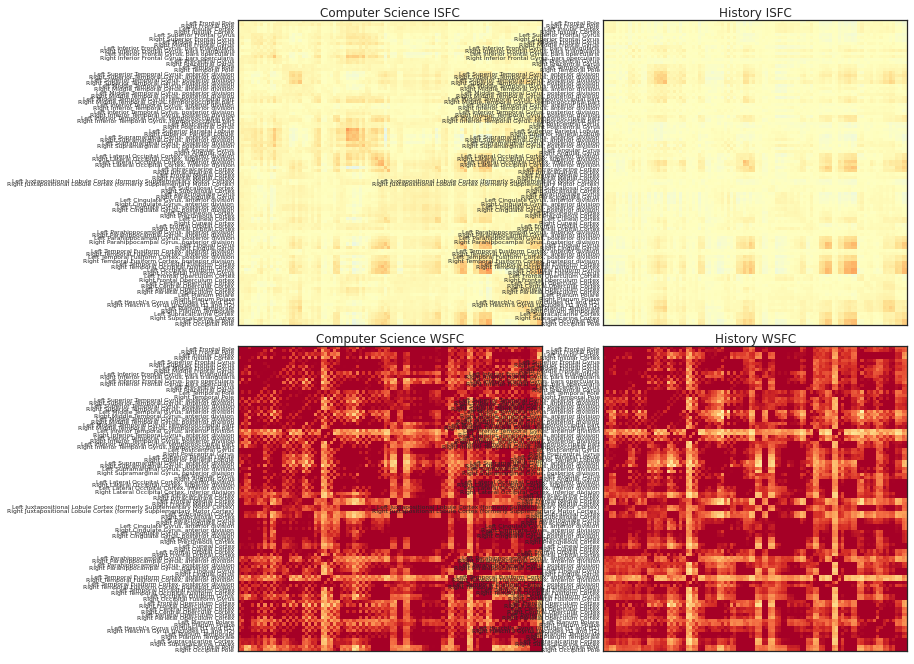

ISFC networks have generally lower correlations than within-subject functional connectivity, but better
differentiate computer science and history videos.

Correlation between computer science and history ISFC networks: 0.671
Correlation between computer science and history WSFC networks: 0.919


In [411]:
from scipy.spatial.distance import squareform
# Visualize ISFC/within-subject functional connectivity (WSFC) matrices for computer science and history videos
vmin, vmax = -.5, .5
sns.set_style('white')

fig, axs = plt.subplots(2, 2, figsize=(12, 12))
fc_mats = [cosVid_mean_isfc_maps, histVid_mean_isfc_maps, cosVid_fcs, histVid_fcs]
fc_titles = ['Computer Science ISFC', 'History ISFC',
             'Computer Science WSFC', 'History WSFC']


for ax, fc, t in zip(axs.flatten(), fc_mats, fc_titles):
    ax.matshow(fc, vmax=vmax, vmin=vmin, cmap='RdYlBu_r')
    ax.set_xlabel(t)
    ax.xaxis.set_label_position('top')
    ax.set_xticks([])
    ax.set_yticks(range(len(atlas.labels[1:])))
    ax.set_yticklabels(atlas.labels[1:])
    ax.tick_params(axis='y', which='both', length=0, labelsize=6)
plt.subplots_adjust(hspace=0)
plt.show()



# High correlation between pieman and cos
# for within-subject functional connectivity
fc_r = pearsonr(squareform(cosVid_fcs, checks=False),
                squareform(histVid_fcs, checks=False))[0]

# ISFC is more distinct for pieman and cos conditions
isfc_r = pearsonr(squareform(cosVid_mean_isfc_maps, checks=False),
                  squareform(histVid_mean_isfc_maps, checks=False))[0]

print("ISFC networks have generally lower correlations than "
      "within-subject functional connectivity, but better\n"
      "differentiate computer science and history videos.\n")
print(f"Correlation between computer science and history ISFC networks: {isfc_r:.3}")
print(f"Correlation between computer science and history WSFC networks: {fc_r:.3}")

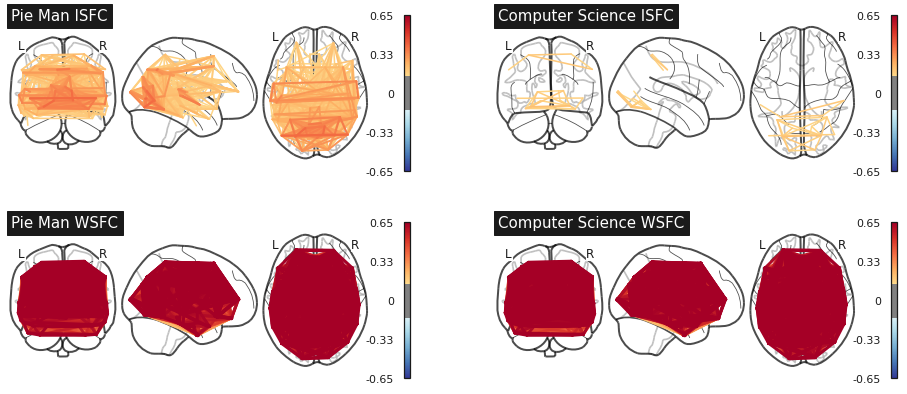

The ISFC connectome better differentiates pieman and computer science stimuli.


In [412]:
from nilearn.plotting import (find_xyz_cut_coords,
                              plot_connectome,
                              plot_stat_map)
# Visualize WSFC and ISFC connectome on glass brain (takes a minute to render)
display_mode = 'ortho'
edge_threshold = .15
edge_vmin, edge_vmax = -.65, .65
edge_cmap='RdYlBu_r'

fc_mats = [piemanVid_mean_isfc_maps, cosVid_mean_isfc_maps, piemanVid_fcs, cosVid_fcs]
fc_titles = ['Pie Man ISFC', 'Computer Science ISFC',
             'Pie Man WSFC', 'Computer Science WSFC']

fig, axs = plt.subplots(2, 2, figsize = (16, 7))
for ax, fc, t in zip(axs.flatten(), fc_mats, fc_titles):
    plot_connectome(fc, node_coords = parcel_coords, node_size=0,
                    edge_threshold=edge_threshold, 
                    edge_vmin=edge_vmin, edge_vmax=edge_vmax,
                    edge_cmap=edge_cmap, 
                    display_mode=display_mode, 
                    title=t, axes=ax, colorbar=True)
plt.show()

#plotting.plot_connectome(corrected_piemanVid_isfc_lspl, node_coords = parcel_coords, edge_threshold='95%', title ="piemanVid fc lSPL")
#edge_threshold='95%'
print("The ISFC connectome better differentiates "
      "pieman and computer science stimuli.")

##  Attempting  Bootstrap for Seed-Based ISFC Maps<a id="boot_seede"></a>

In [545]:
piemanVid_isfc_maps_allsubs[:,34,:].shape

(21, 96)

In [546]:
piemanVid_isfc_lspl_observed, piemanVid_isfc_lspl_ci, piemanVid_isfc_lspl_p, piemanVid_isfc_lspl_distribution = brainiak.isc.bootstrap_isc(piemanVid_isfc_maps_allsubs[:,34,:], pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)
print("the shape of the piemanVid P values is", piemanVid_isfc_lspl_p.shape)
print("the shape of the piemanVid distribution is", piemanVid_isfc_lspl_distribution.shape)
print("bootstrap ISC for seed-based ISFC yields", count_pvals(piemanVid_isfc_lspl_p),"significant voxels out of", len(piemanVid_isfc_lspl_p))

the shape of the piemanVid P values is (96,)
the shape of the piemanVid distribution is (1000, 96)
bootstrap ISC yields 70 significant voxels out of 96


In [547]:
cosVid_isfc_lspl_observed, cosVid_isfc_lspl_ci, cosVid_isfc_lspl_p, cosVid_isfc_lspl_distribution = brainiak.isc.bootstrap_isc(cosVid_isfc_maps_allsubs[:,34,:], pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)
print("the shape of the cosVid P values is", cosVid_isfc_lspl_p.shape)
print("the shape of the cosVid distribution is", cosVid_isfc_lspl_distribution.shape)
print("bootstrap ISC for seed-based ISFC yields", count_pvals(cosVid_isfc_lspl_p),"significant voxels out of", len(cosVid_isfc_lspl_p))

the shape of the cosVid P values is (96,)
the shape of the cosVid distribution is (1000, 96)
bootstrap ISC for seed-based ISFC yields 55 significant voxels out of 96


In [548]:
histVid_isfc_lspl_observed, histVid_isfc_lspl_ci, histVid_isfc_lspl_p, histVid_isfc_lspl_distribution = brainiak.isc.bootstrap_isc(histVid_isfc_maps_allsubs[:,34,:], pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)
print("the shape of the histVid P values is", histVid_isfc_lspl_p.shape)
print("the shape of the histVid distribution is", histVid_isfc_lspl_distribution.shape)
print("bootstrap ISC for seed-based ISFC yields", count_pvals(histVid_isfc_lspl_p),"significant voxels out of", len(histVid_isfc_lspl_p))

the shape of the histVid P values is (96,)
the shape of the histVid distribution is (1000, 96)
bootstrap ISC for seed-based ISFC yields 2 significant voxels out of 96


In [ ]:
# Correct the map using FDR q values
# Take the mean ISC map and zero out the insignificant voxels
corrected_mean_piemanVid_isc_voxels = np.mean(piemanVid_isc_map, axis = 0)
for i in range(len(piemanVid_fdr[0])):
    if piemanVid_fdr[0][i] == False:
        corrected_mean_piemanVid_isc_voxels[i] = 0

# Make the ISC output a volume
corrected_piemanVid_isc_vol = np.zeros(brain_nii.shape)
# Map the ISC data for the first participant into brain space
corrected_piemanVid_isc_vol[coords] = corrected_mean_piemanVid_isc_voxels
# make a nii image of the isc map 
corrected_piemanVid_mean_isc_nifti = nib.Nifti1Image(corrected_piemanVid_isc_vol, brain_nii.affine, brain_nii.header)

In [558]:
corrected_bootstrap_piemanVid_isfc_lspl = correct_fdr_pvals(piemanVid_isfc_maps_allsubs, piemanVid_isfc_lspl_p)

69


In [559]:
corrected_bootstrap_cosVid_isfc_lspl = correct_fdr_pvals(cosVid_isfc_maps_allsubs,cosVid_isfc_lspl_p)

54


In [561]:
corrected_bootstrap_cosVid_isfc_lspl.shape

(96, 96)

In [562]:
corrected_bootstrap_piemanVid_isfc_lspl.shape

(96, 96)

In [563]:
corrected_bootstrap_histVid_isfc_lspl.shape

(96, 96)

In [560]:
corrected_bootstrap_histVid_isfc_lspl = correct_fdr_pvals(histVid_isfc_maps_allsubs, histVid_isfc_lspl_p)

0


In [580]:
def correct_isfc_bootstrap(isfc_maps_allsubs, roi, q): 
    
    observed, ci, p, distribution = brainiak.isc.bootstrap_isc(isfc_maps_allsubs[:,roi,:], pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)

    #FDR correction to get corrected p values
    fdr_corrected_bool_roi, fdr_corrected_pvals_roi = fdr_correction(p, alpha=q, method='indep')
    # take the mean of the isfc map
    corrected_isfc = np.mean(isfc_maps_allsubs, axis = 0) # shape (96,96)
    for i in range(96):
        if fdr_corrected_pvals_roi[i] > .05: # if corrected pval <.05, zero first dimension # might also change this to q
            corrected_isfc[i] = 0            # corrected_isfc[i].shape = (96,)
    print(np.sum(fdr_corrected_bool_roi))    # print the number of significant ROIs
    return corrected_isfc

In [581]:
bootstrap_piemanVid_lspl = correct_isfc_bootstrap(piemanVid_isfc_maps_allsubs, 34, .05)

69


In [582]:
bootstrap_piemanVid_rspl = correct_isfc_bootstrap(piemanVid_isfc_maps_allsubs, 35, .05)

64


In [583]:
bootstrap_cosVid_lspl = correct_isfc_bootstrap(cosVid_isfc_maps_allsubs, 34, .05)

55


In [584]:
bootstrap_cosVid_rspl = correct_isfc_bootstrap(cosVid_isfc_maps_allsubs, 35, .05)

66


In [585]:
bootstrap_histVid_lspl = correct_isfc_bootstrap(histVid_isfc_maps_allsubs, 34, .05)

0


##  Stastistical Tests for Seed-Based ISFC Maps<a id="seed_based"></a>
I will now use ROIs as seeds to get ROI-based connectivity maps. I am permuting the ISFC maps to get observed and null distributions, and then p values from the function p_from_null. Then I correct for multiple comparisons using FDR to then zeros out non-significantly connected ROIs to then plot seed-based connectivity maps across different conditions. Later in the notebook, I create a function to correct and prepare the image int he function create_img_for_roi, but here, I am showing how I got to that function.

In [430]:
def make_null(isfc_maps_all_subs):
    null = np.zeros((21,96,96,1000))
    for i in range(21):
        for j in range(1000):
            null[i,:,:,j] = np.random.permutation(isfc_maps_all_subs[i]) # shuffles slong first index
    return null

In [431]:
piemanVid_null = make_null(piemanVid_isfc_maps_allsubs)
piemanVid_null.shape

(21, 96, 96, 1000)

In [432]:
cosVid_null = make_null(cosVid_isfc_maps_allsubs)

In [433]:
histVid_null = make_null(histVid_isfc_maps_allsubs)

In [434]:
def null_observed(null, roi, isfc_map_all_subs):
    new_null = np.mean(null[:,roi,:,:],axis=0)  # size (96,1000)
    new_observed =np.mean(isfc_map_all_subs[:,roi,:],axis=0) # size (96)
    return new_null, new_observed

In [435]:
piemanVid_new_null_lspl, piemanVid_new_observed_lspl = null_observed(piemanVid_null, 34, piemanVid_isfc_maps_allsubs)
print(piemanVid_new_null_lspl.shape)
print(piemanVid_new_observed_lspl.shape)

(96, 1000)
(96,)


In [436]:
cosVid_new_null_lspl, cosVid_new_observed_lspl = null_observed(cosVid_null, 34, cosVid_isfc_maps_allsubs)

In [437]:
histVid_new_null_lspl, histVid_new_observed_lspl = null_observed(histVid_null, 34, histVid_isfc_maps_allsubs)

In [438]:
def pvals_from_null(new_observed, new_null):
    pvals_from_null = np.zeros((96))
    for i in range(96):
        pvals_from_null[i] = brainiak.utils.utils.p_from_null(new_observed[i], new_null[i,:]) #SHOULD BE new_null[i,:]
    return pvals_from_null

In [439]:
pvals_piemanVid_isfc_lspl = pvals_from_null(piemanVid_new_observed_lspl, piemanVid_new_null_lspl)

In [440]:
pvals_cosVid_isfc_lspl = pvals_from_null(cosVid_new_observed_lspl, cosVid_new_null_lspl)

In [441]:
pvals_histVid_isfc_lspl = pvals_from_null(histVid_new_observed_lspl, histVid_new_null_lspl)

28 significant ROIs out of (96,)


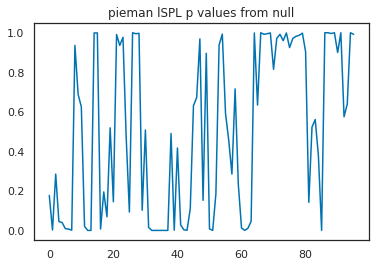

In [442]:
plt.plot(pvals_piemanVid_isfc_lspl)
plt.title("pieman lSPL p values from null")
print(count_pvals(pvals_piemanVid_isfc_lspl), "significant ROIs out of", pvals_piemanVid_isfc_lspl.shape)

In [443]:
def count_pvals(pvals):
    count = 0
    for i in range(len(pvals)):
        if pvals[i] < .05:
            count = count + 1 
    return count

## FDR Correction for Seed-Based ISFC Maps<a id="fdr_seed"></a>
Correcting the maps for specific ROIs. Note that it is not standard to correct raw ISFC maps, but rather I am correcting when I compare seed-based connectivitity maps between conditions. 

In [444]:
fdr_corrected_bool_pvals_piemanVid_isfc_lspl, fdr_corrected_pvals_piemanVid_isfc_lspl = fdr_correction(pvals_piemanVid_isfc_lspl, alpha=0.05, method='indep')
print("out of 96 ROIs, this many are significant:", np.sum(fdr_corrected_bool_pvals_piemanVid_isfc_lspl))

out of 96 ROIs, this many are significant: 20


In [445]:
def correct_fdr_pvals(isfc_maps_allsubs, pvals_roi): 
    #FDR correction to get corrected p values
    fdr_corrected_bool_roi, fdr_corrected_pvals_roi = fdr_correction(pvals_roi, alpha=0.05, method='indep')
    # take the mean of the isfc map
    corrected_isfc = np.mean(isfc_maps_allsubs, axis = 0) # shape (96,96)
    for i in range(96):
        if fdr_corrected_pvals_roi[i] > .05: # if corrected pval <.05, zero first dimension
            corrected_isfc[i] = 0            # corrected_isfc[i].shape = (96,)
    print(np.sum(fdr_corrected_bool_roi))    # print the number of significant ROIs
    return corrected_isfc

In [446]:
corrected_piemanVid_isfc_lspl = correct_fdr_pvals(piemanVid_isfc_maps_allsubs, pvals_piemanVid_isfc_lspl)
print(corrected_piemanVid_isfc_lspl.shape)

20
(96, 96)


In [447]:
corrected_cosVid_isfc_lspl = correct_fdr_pvals(cosVid_isfc_maps_allsubs, pvals_cosVid_isfc_lspl)

41


In [448]:
corrected_histVid_isfc_lspl = correct_fdr_pvals(histVid_isfc_maps_allsubs, pvals_histVid_isfc_lspl)

0


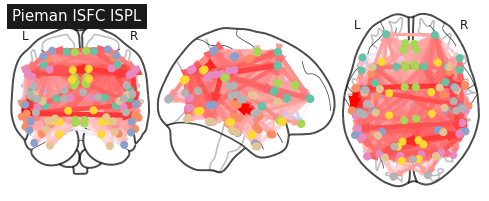

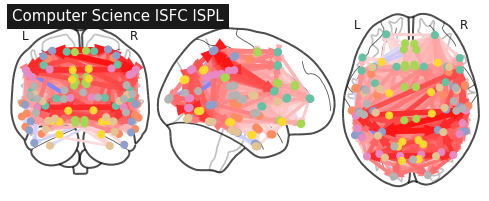

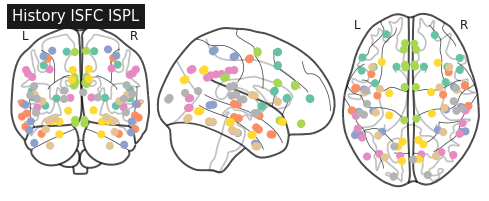

In [449]:
parcel_coords = plotting.find_parcellation_cut_coords(atlas.maps)
plotting.plot_connectome(corrected_piemanVid_isfc_lspl, node_coords = parcel_coords, edge_threshold='80%', title ="Pieman ISFC lSPL")
plotting.plot_connectome(corrected_cosVid_isfc_lspl, node_coords = parcel_coords, edge_threshold='80%', title ="Computer Science ISFC lSPL")
plotting.plot_connectome(corrected_histVid_isfc_lspl, node_coords = parcel_coords, edge_threshold='80%', title ="History ISFC lSPL")

In [450]:
# Note that I could have used bootstrap_isc on the ISFC maps to get p values (instead of using p_from_null)
piemanVid_isfc_observed, piemanVid_isfc_ci, piemanVid_isfc_p, piemanVid_isfc_distribution = brainiak.isc.bootstrap_isc(piemanVid_isfc_maps_allsubs[:,:,0], pairwise=False, summary_statistic='median', n_bootstraps=1000, ci_percentile=95, side='right', random_state=None)
piemanVid_isfc_p.shape
print(count_pvals(piemanVid_isfc_p), "significant p values out of", piemanVid_isfc_p.shape)

69 significant p values out of (96,)


## Images at scale

In [451]:
def create_img_for_roi(isfc_maps_all_subs, roi):
    # This function creates an ROI to brain plot for mean corrected ISFC for a specific ROI
    null = make_null(isfc_maps_all_subs)
    new_null, new_observed = null_observed(null, roi, isfc_maps_all_subs)
    pvals = pvals_from_null(new_observed, new_null)
    mean_corrected_isfc = correct_fdr_pvals(isfc_maps_all_subs, pvals)
    # In the last function, I corrrected to already have the mean 
    plot_values_corrected=np.array(mean_corrected_isfc[roi])
    # Covert to format for surface plot
    contribution_of_rois_image = roi_to_brain(plot_values_corrected, expand_mask(load_img(atlas.maps)))
    return contribution_of_rois_image

In [452]:
def get_maps(isfc_maps_all_subs, roi):
    # this function creates an ISFC map for a given ROI
    null = make_null(isfc_maps_all_subs)
    new_null, new_observed = null_observed(null, roi, isfc_maps_all_subs)
    pvals = pvals_from_null(new_observed, new_null)
    mean_corrected_isfc = correct_fdr_pvals(isfc_maps_all_subs, pvals)
    return mean_corrected_isfc

In [453]:
# right SPL (math)
corrected_piemanVid_isfc_rspl = get_maps(piemanVid_isfc_maps_allsubs, 35)
corrected_cosVid_isfc_rspl = get_maps(cosVid_isfc_maps_allsubs, 35)
corrected_histVid_isfc_rspl = get_maps(histVid_isfc_maps_allsubs, 35)

10
42
0


In [455]:
# left SPL (math)
contribution_of_rois_image_piemanVid_corrected_lspl = create_img_for_roi(piemanVid_isfc_maps_allsubs, 34)
contribution_of_rois_image_cosVid_corrected_lspl = create_img_for_roi(cosVid_isfc_maps_allsubs, 34)
contribution_of_rois_image_histVid_corrected_lspl = create_img_for_roi(histVid_isfc_maps_allsubs, 34)

19
43
0


In [457]:
# visual area (left intracalcarine sulcus)
contribution_of_rois_image_piemanVid_corrected_lvis = create_img_for_roi(piemanVid_isfc_maps_allsubs, 46)
contribution_of_rois_image_cosVid_corrected_lvis = create_img_for_roi(cosVid_isfc_maps_allsubs, 46)
contribution_of_rois_image_histVid_corrected_lvis = create_img_for_roi(histVid_isfc_maps_allsubs, 46)

61
45
44


In [458]:
# visual area (right intracalcarine sulcus)
contribution_of_rois_image_piemanVid_corrected_rvis = create_img_for_roi(piemanVid_isfc_maps_allsubs, 47)
contribution_of_rois_image_cosVid_corrected_rvis = create_img_for_roi(cosVid_isfc_maps_allsubs, 47)
contribution_of_rois_image_histVid_corrected_rvis = create_img_for_roi(histVid_isfc_maps_allsubs, 47)

68
43
39


In [460]:
# Left Lateral Occipital Cortex, superior division
contribution_of_rois_image_piemanVid_corrected_lvis_s = create_img_for_roi(piemanVid_isfc_maps_allsubs, 42)
contribution_of_rois_image_cosVid_corrected_lvis_s = create_img_for_roi(cosVid_isfc_maps_allsubs, 42)
contribution_of_rois_image_histVid_corrected_lvis_s = create_img_for_roi(histVid_isfc_maps_allsubs, 42)

34
34
34


In [459]:
# Right Lateral Occipital Cortex, superior division
contribution_of_rois_image_piemanVid_corrected_rvis_s = create_img_for_roi(piemanVid_isfc_maps_allsubs, 43)
contribution_of_rois_image_cosVid_corrected_rvis_s = create_img_for_roi(cosVid_isfc_maps_allsubs, 43)
contribution_of_rois_image_histVid_corrected_rvis_s = create_img_for_roi(histVid_isfc_maps_allsubs, 43)

49
49
39


In [463]:
# Left Lateral Occipital Cortex, inferior division
contribution_of_rois_image_piemanVid_corrected_lvis_i = create_img_for_roi(piemanVid_isfc_maps_allsubs, 44)
contribution_of_rois_image_cosVid_corrected_lvis_i = create_img_for_roi(cosVid_isfc_maps_allsubs, 44)
contribution_of_rois_image_histVid_corrected_lvis_i = create_img_for_roi(histVid_isfc_maps_allsubs, 44)

37
55
57


In [464]:
# Right Lateral Occipital Cortex, inferior division
contribution_of_rois_image_piemanVid_corrected_rvis_i = create_img_for_roi(piemanVid_isfc_maps_allsubs, 45)
contribution_of_rois_image_cosVid_corrected_rvis_i = create_img_for_roi(cosVid_isfc_maps_allsubs, 45)
contribution_of_rois_image_histVid_corrected_rvis_i = create_img_for_roi(histVid_isfc_maps_allsubs, 45)

35
65
55


In [465]:
# Left Occipital Fusiform Gyrus
contribution_of_rois_image_piemanVid_corrected_lvis_fg = create_img_for_roi(piemanVid_isfc_maps_allsubs, 78)
contribution_of_rois_image_cosVid_corrected_lvis_fg = create_img_for_roi(cosVid_isfc_maps_allsubs, 78)
contribution_of_rois_image_histVid_corrected_lvis_fg = create_img_for_roi(histVid_isfc_maps_allsubs, 78)

39
44
61


In [466]:
# Right Occipital Fusiform Gyrus
contribution_of_rois_image_piemanVid_corrected_rvis_fg = create_img_for_roi(piemanVid_isfc_maps_allsubs, 79)
contribution_of_rois_image_cosVid_corrected_rvis_fg = create_img_for_roi(cosVid_isfc_maps_allsubs, 79)
contribution_of_rois_image_histVid_corrected_rvis_fg = create_img_for_roi(histVid_isfc_maps_allsubs, 79)

52
47
62


In [467]:
# Left Middle Temporal Gyrus, posterior division
contribution_of_rois_image_piemanVid_corrected_lmp_aud = create_img_for_roi(piemanVid_isfc_maps_allsubs, 22)
contribution_of_rois_image_cosVid_corrected_lmp_aud = create_img_for_roi(cosVid_isfc_maps_allsubs, 22)
contribution_of_rois_image_histVid_corrected_lmp_aud = create_img_for_roi(histVid_isfc_maps_allsubs, 22)

17
2
20


In [468]:
# Right Middle Temporal Gyrus, posterior division
contribution_of_rois_image_piemanVid_corrected_rmp_aud = create_img_for_roi(piemanVid_isfc_maps_allsubs, 23)
contribution_of_rois_image_cosVid_corrected_rmp_aud = create_img_for_roi(cosVid_isfc_maps_allsubs, 23)
contribution_of_rois_image_histVid_corrected_rmp_aud = create_img_for_roi(histVid_isfc_maps_allsubs, 23)

23
0
4


In [529]:
# Left Middle Temporal Gyrus, anterior division
contribution_of_rois_image_piemanVid_corrected_lma_aud = create_img_for_roi(piemanVid_isfc_maps_allsubs, 20)
contribution_of_rois_image_cosVid_corrected_lma_aud = create_img_for_roi(cosVid_isfc_maps_allsubs, 20)
contribution_of_rois_image_histVid_corrected_lma_aud = create_img_for_roi(histVid_isfc_maps_allsubs, 20)

13
2
26


In [470]:
# Right Middle Temporal Gyrus, anterior division
contribution_of_rois_image_piemanVid_corrected_rma_aud = create_img_for_roi(piemanVid_isfc_maps_allsubs, 21)
contribution_of_rois_image_cosVid_corrected_rma_aud = create_img_for_roi(cosVid_isfc_maps_allsubs, 21)
contribution_of_rois_image_histVid_corrected_rma_aud = create_img_for_roi(histVid_isfc_maps_allsubs, 21)

11
0
4


In [471]:
# Left Angular Gyrus 
contribution_of_rois_image_piemanVid_corrected_lag = create_img_for_roi(piemanVid_isfc_maps_allsubs, 40)
contribution_of_rois_image_cosVid_corrected_lag = create_img_for_roi(cosVid_isfc_maps_allsubs, 40)
contribution_of_rois_image_histVid_corrected_lag = create_img_for_roi(histVid_isfc_maps_allsubs, 40)

20
17
10


In [472]:
# Right Angular Gyrus
contribution_of_rois_image_piemanVid_corrected_rag = create_img_for_roi(piemanVid_isfc_maps_allsubs, 41)
contribution_of_rois_image_cosVid_corrected_rag = create_img_for_roi(cosVid_isfc_maps_allsubs, 41)
contribution_of_rois_image_histVid_corrected_rag = create_img_for_roi(histVid_isfc_maps_allsubs, 41)

31
22
24


##  Plotting Seed-Based ISFC Maps 


In [683]:
# the following plots are commented because they are quite large

In [673]:
# view = plotting.view_img_on_surf(contribution_of_rois_image_piemanVid_corrected_lvis.to_nifti(), threshold='0%', vmax=0.2, title = 'title')
# view.open_in_browser()

# view

In [684]:
# from nilearn.plotting import view_img_on_surf
# from nilearn import datasets
# from nltools.mask import expand_mask, roi_to_brain
# thresh = 0
# # first, load the atlas
# #atlas = datasets.fetch_atlas_harvard_oxford(atlas_name='cort-maxprob-thr25-2mm', data_dir=atlas_dir)
# # isfc_row should be a vector of length 96
# #plot_values=np.array(cosVid_mean_isfc_maps[34])
# # covert to format for surface plot
# #contribution_of_rois_image = roi_to_brain(plot_values, expand_mask(load_img(atlas.maps)))
# # plot on surface
# view_img_on_surf(contribution_of_rois_image_piemanVid_corrected_lvis.to_nifti(),
#                  surf_mesh="fsaverage",              
#                  threshold=thresh,
#                  symmetric_cmap=True,
#              #    cmap='coolwarm',
#                  cmap = "coolwarm",
#                  title = 'piemanVid lvis',
#                  vmax = .2,
#                  vmin = -.2
#                 # vol_to_surf_kwargs={"n_samples": 1, "radius": 0.0, "interpolation": "nearest"}
#                 )

In [473]:
# Superior Parietal Lobule
lspl = [contribution_of_rois_image_piemanVid_corrected_lspl, contribution_of_rois_image_cosVid_corrected_lspl, contribution_of_rois_image_histVid_corrected_lspl]
rspl = [contribution_of_rois_image_piemanVid_corrected_rspl, contribution_of_rois_image_cosVid_corrected_rspl, contribution_of_rois_image_histVid_corrected_rspl]
# Intracalcarine Cortex
lvis = [contribution_of_rois_image_piemanVid_corrected_lvis, contribution_of_rois_image_histVid_corrected_lvis, contribution_of_rois_image_cosVid_corrected_lvis]
rvis = [contribution_of_rois_image_piemanVid_corrected_rvis, contribution_of_rois_image_histVid_corrected_rvis, contribution_of_rois_image_cosVid_corrected_rvis]
# Lateral Superior Occipital Cortex
lvis_s = [contribution_of_rois_image_piemanVid_corrected_lvis_s, contribution_of_rois_image_cosVid_corrected_lvis_s, contribution_of_rois_image_histVid_corrected_lvis_s]
rvis_s = [contribution_of_rois_image_piemanVid_corrected_rvis_s, contribution_of_rois_image_cosVid_corrected_rvis_s, contribution_of_rois_image_histVid_corrected_rvis_s]
# Lateral Inferior Occipital Cortex
lvis_i = [contribution_of_rois_image_piemanVid_corrected_lvis_i, contribution_of_rois_image_cosVid_corrected_lvis_i, contribution_of_rois_image_histVid_corrected_lvis_i]
rvis_i = [contribution_of_rois_image_piemanVid_corrected_rvis_i, contribution_of_rois_image_cosVid_corrected_rvis_i, contribution_of_rois_image_histVid_corrected_rvis_i]
# Occipital Fusiform Gyrus
lvis_fg = [contribution_of_rois_image_piemanVid_corrected_lvis_fg, contribution_of_rois_image_cosVid_corrected_lvis_fg, contribution_of_rois_image_histVid_corrected_lvis_fg]
rvis_fg = [contribution_of_rois_image_piemanVid_corrected_rvis_fg, contribution_of_rois_image_cosVid_corrected_rvis_fg, contribution_of_rois_image_histVid_corrected_rvis_fg]
# Middle Posterior Temporal Gyrus
lmp_aud = [contribution_of_rois_image_piemanVid_corrected_lmp_aud, contribution_of_rois_image_cosVid_corrected_lmp_aud, contribution_of_rois_image_histVid_corrected_lmp_aud]
rmp_aud = [contribution_of_rois_image_piemanVid_corrected_rmp_aud, contribution_of_rois_image_cosVid_corrected_rmp_aud, contribution_of_rois_image_histVid_corrected_rmp_aud]
# Middle Anterior Temporal Gyrus
lma_aud = [contribution_of_rois_image_piemanVid_corrected_lma_aud, contribution_of_rois_image_cosVid_corrected_lma_aud, contribution_of_rois_image_histVid_corrected_lma_aud]
rma_aud = [contribution_of_rois_image_piemanVid_corrected_rma_aud, contribution_of_rois_image_cosVid_corrected_rma_aud, contribution_of_rois_image_histVid_corrected_rma_aud]
# Angular Gyrus
lag = [contribution_of_rois_image_piemanVid_corrected_lag, contribution_of_rois_image_cosVid_corrected_lag, contribution_of_rois_image_histVid_corrected_lag]
rag = [contribution_of_rois_image_piemanVid_corrected_rag, contribution_of_rois_image_cosVid_corrected_rag, contribution_of_rois_image_histVid_corrected_rag]

In [622]:
def make_lots_plots(data_left, data_right, title):    
    # Left
    plotting.plot_img_on_surf(data_left[0].to_nifti(),
                              views=['lateral', 'medial'],
                              hemispheres=['left', 'right'],
                              colorbar=True,
                              cmap= "coolwarm",
                              vmax = .2,
                             title= 'Pie Man Left %s' % (title))
    plotting.show()
    plotting.plot_img_on_surf(data_left[1].to_nifti(),
                              views=['lateral', 'medial'],
                              hemispheres=['left', 'right'],
                              colorbar=True,
                              cmap= "coolwarm",
                              vmax = .2,
                             title= 'Computer Science Left %s' % (title))
    plotting.show()
    plotting.plot_img_on_surf(data_left[2].to_nifti(),
                              views=['lateral', 'medial'],
                              hemispheres=['left', 'right'],
                              colorbar=True,
                              cmap= "coolwarm",
                              vmax = .2,
                             title= 'History Left %s' % (title))
    plotting.show()
   
    # Right
    plotting.plot_img_on_surf(data_right[0].to_nifti(),
                              views=['lateral', 'medial'],
                              hemispheres=['left', 'right'],
                              colorbar=True,
                              cmap= "coolwarm",
                              vmax = .2,
                             title= 'Pie Man Right %s' % (title))
    plotting.show()
    plotting.plot_img_on_surf(data_right[1].to_nifti(),
                              views=['lateral', 'medial'],
                              hemispheres=['left', 'right'],
                              colorbar=True,
                              cmap= "coolwarm",
                              vmax = .2,
                             title= 'Computer Science Right %s' % (title))
    plotting.show()
    plotting.plot_img_on_surf(data_right[2].to_nifti(),
                              views=['lateral', 'medial'],
                              hemispheres=['left', 'right'],
                              colorbar=True,
                              cmap= "coolwarm",
                              vmax = .2,
                             title= 'History Right %s' % (title))
    plotting.show()

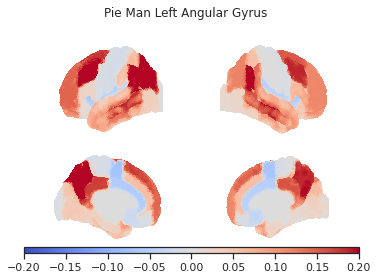

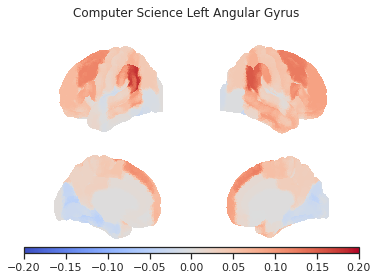

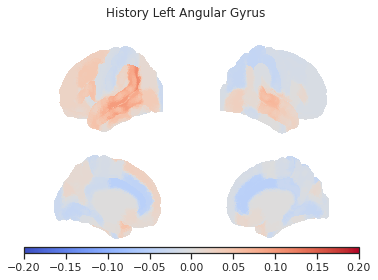

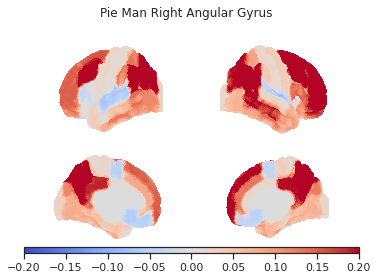

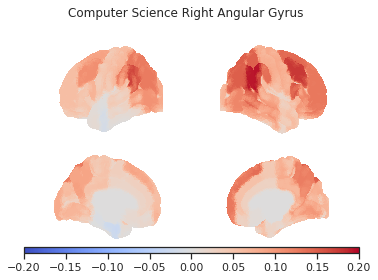

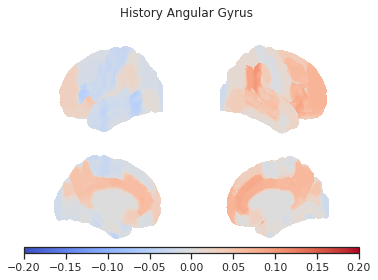

In [518]:
make_lots_plots(lag, rag, 'Angular Gyrus')

## Comparing ISFC Maps Across Conditions <a id="compare_isfc"></a>
Here, I use seuqreform to convert back and fourth between vectorized versions of ISFC. I subtract between two maps, I do a simple t test, correct the p values using FDR and then correct ISFC values (from the subtracted ISFC maps)

In [286]:
# Squareform ISFC converts the symmetrical (square, 96x96 for 21 subjects) into a condensed, subjects by voxels
off_diag_piemanVid, diag_piemanVid = brainiak.isc.squareform_isfc(piemanVid_isfc_maps_allsubs)
off_diag_cosVid, diag_cosVid = brainiak.isc.squareform_isfc(cosVid_isfc_maps_allsubs)
off_diag_histVid, diag_histVid = brainiak.isc.squareform_isfc(histVid_isfc_maps_allsubs)
print("off diagonal for pieman is:",off_diag_piemanVid.shape, "and diagonal is:", diag_piemanVid.shape)

off diagonal for pieman is: (21, 4560) and diagonal is: (21, 96)


In [287]:
# subtract the maps
pieman_cos = np.mean((piemanVid_isfc_maps_allsubs - cosVid_isfc_maps_allsubs), axis = 0)
pieman_hist = np.mean((piemanVid_isfc_maps_allsubs - histVid_isfc_maps_allsubs), axis = 0)
cos_hist = np.mean((cosVid_isfc_maps_allsubs - histVid_isfc_maps_allsubs), axis = 0)
print("the shape of the mean (pieman map) - (computer science map) = ", pieman_cos.shape)

the shape of the mean (pieman map) - (computer science map) =  (96, 96)


In [288]:
# Use squareform_isc to get vectorized condeensed ISFC 
off_diag_pieman_cos, diag_pieman_cos = brainiak.isc.squareform_isfc(pieman_cos)
off_diag_pieman_hist, diag_pieman_hist = brainiak.isc.squareform_isfc(pieman_hist)
off_diag_cos_hist, diag_cos_hist = brainiak.isc.squareform_isfc(cos_hist)
print("the shape of off diagonal for mean (pieman map)-(computer science map) =",off_diag_pieman_cos.shape, "and diagonal =", diag_pieman_cos.shape)

the shape of off diagonal for mean (pieman map)-(computer science map) = (4560,) and diagonal = (96,)


In [289]:
# perform a paired t test between conditions
t_pieman_cos, p_pieman_cos = stats.ttest_rel(off_diag_piemanVid,off_diag_cosVid )
t_pieman_hist, p_pieman_hist = stats.ttest_rel(off_diag_piemanVid,off_diag_histVid )
t_cos_hist, p_cos_hist = stats.ttest_rel(off_diag_cosVid,off_diag_histVid )
print("the shape of t for pieman-cos =",t_pieman_cos.shape, "and the shape of p for pieman-cos =", t_pieman_cos.shape )

the shape of t for pieman-cos = (4560,) and the shape of p for pieman-cos = (4560,)


In [290]:
# pieman-cos
pieman_cos_bool, pieman_cos_q = fdr_correction(p_pieman_cos, alpha=0.05, method='indep')
print(np.sum(pieman_cos_bool),"voxels are shared between the pieman and computer science conditions",  "of", len(pieman_cos_bool),"total voxels")

# pieman-hist
pieman_hist_bool, pieman_hist_q = fdr_correction(p_pieman_hist, alpha=0.05, method='indep')
print(np.sum(pieman_hist_bool),"voxels are shared between the pieman and history science conditions",  "of", len(pieman_hist_bool),"total voxels")

#cos-hist
cos_hist_bool, cos_hist_q = fdr_correction(p_cos_hist, alpha=0.05, method='indep')
print(np.sum(cos_hist_bool),"voxels are shared between the computer science and history conditions",  "of", len(cos_hist_bool),"total voxels")

1813 voxels are shared between the pieman and computer science conditions of 4560 total voxels
2635 voxels are shared between the pieman and history science conditions of 4560 total voxels
1671 voxels are shared between the computer science and history conditions of 4560 total voxels


In [291]:
# correct the pieman-cos map, only collect voxels that are shared
pieman_cos_isfcs_thresh = np.full(pieman_cos_q.shape, np.nan)
# gives a vector of nans that is the shape of isfc vectorized matrix 
pieman_cos_isfcs_thresh[pieman_cos_q<.05] = off_diag_pieman_cos[pieman_cos_q<.05] 
#where fdr is less than .05, stick the values back in there, otherwise, nans

# correct the pieman-hist map, only collect voxels that are shared
pieman_hist_isfcs_thresh = np.full(pieman_hist_q.shape, np.nan)
# gives a vector of nans that is the shape of isfc vectorized matrix 
pieman_hist_isfcs_thresh[pieman_hist_q<.05] = off_diag_pieman_hist[pieman_hist_q<.05] 
#where fdr is less than .05, stick the values back in there, otherwise, nans

# correct the cos-hist map, only collect voxels that are shared
cos_hist_isfcs_thresh = np.full(cos_hist_q.shape, np.nan)
# gives a vector of nans that is the shape of isfc vectorized matrix 
cos_hist_isfcs_thresh[cos_hist_q<.05] = off_diag_cos_hist[cos_hist_q<.05] 
#where fdr is less than .05, stick the values back in there, otherwise, nans

In [292]:
corrected_pieman_cos_map = brainiak.isc.squareform_isfc(pieman_cos_isfcs_thresh, diag_pieman_cos)
corrected_pieman_hist_map = brainiak.isc.squareform_isfc(pieman_hist_isfcs_thresh, diag_pieman_hist)
corrected_cos_hist_map = brainiak.isc.squareform_isfc(cos_hist_isfcs_thresh, diag_cos_hist)
print("the maps have shape", corrected_pieman_cos_map.shape)

the maps have shape (96, 96)


In [666]:
contribution_of_rois_cos_hist = roi_to_brain(corrected_cos_hist_map[:,], expand_mask(load_img(atlas.maps)))

In [665]:
contribution_of_rois_cos_hist.shape

<bound method Brain_Data.shape of nltools.data.brain_data.Brain_Data(data=(96, 238955), Y=0, X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz, output_file=[])>

In [677]:
# # having trouble plotting this on a brain
# # future work can look at seed-based maps to visualize the matrices below 

# from nilearn.plotting import view_img_on_surf
# from nilearn import datasets
# from nltools.mask import expand_mask, roi_to_brain
# thresh = 0
# # first, load the atlas
# #atlas = datasets.fetch_atlas_harvard_oxford(atlas_name='cort-maxprob-thr25-2mm', data_dir=atlas_dir)
# # isfc_row should be a vector of length 96
# #plot_values=np.array(cosVid_mean_isfc_maps[34])
# # covert to format for surface plot
# #contribution_of_rois_image = roi_to_brain(plot_values, expand_mask(load_img(atlas.maps)))
# # plot on surface
# view_img_on_surf(contribution_of_rois_cos_hist.to_nifti(),
#                  surf_mesh="fsaverage",              
#                  threshold=thresh,
#                  symmetric_cmap=False,
#                  cmap='coolwarm',
#                  title = 'histVid Lspl',
#                  vmax = .2,
#                  vmin = -.2
#                 # vol_to_surf_kwargs={"n_samples": 1, "radius": 0.0, "interpolation": "nearest"}
#                 )

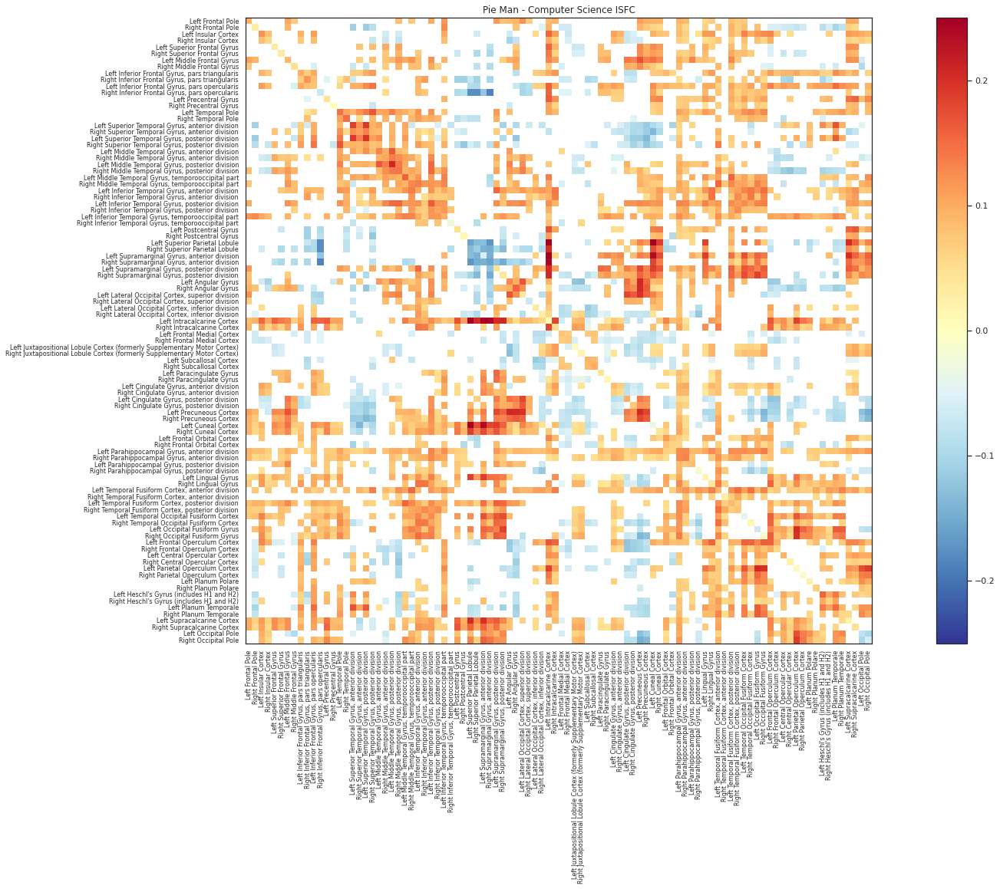

In [425]:
# corrected ISFC map of shared connectivity between pieman and computer science conditions
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(corrected_pieman_cos_map, interpolation='None', cmap='RdYlBu_r', vmin = -.25, vmax = .25)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("Pie Man - Computer Science ISFC")
f.colorbar(im,ax=ax);

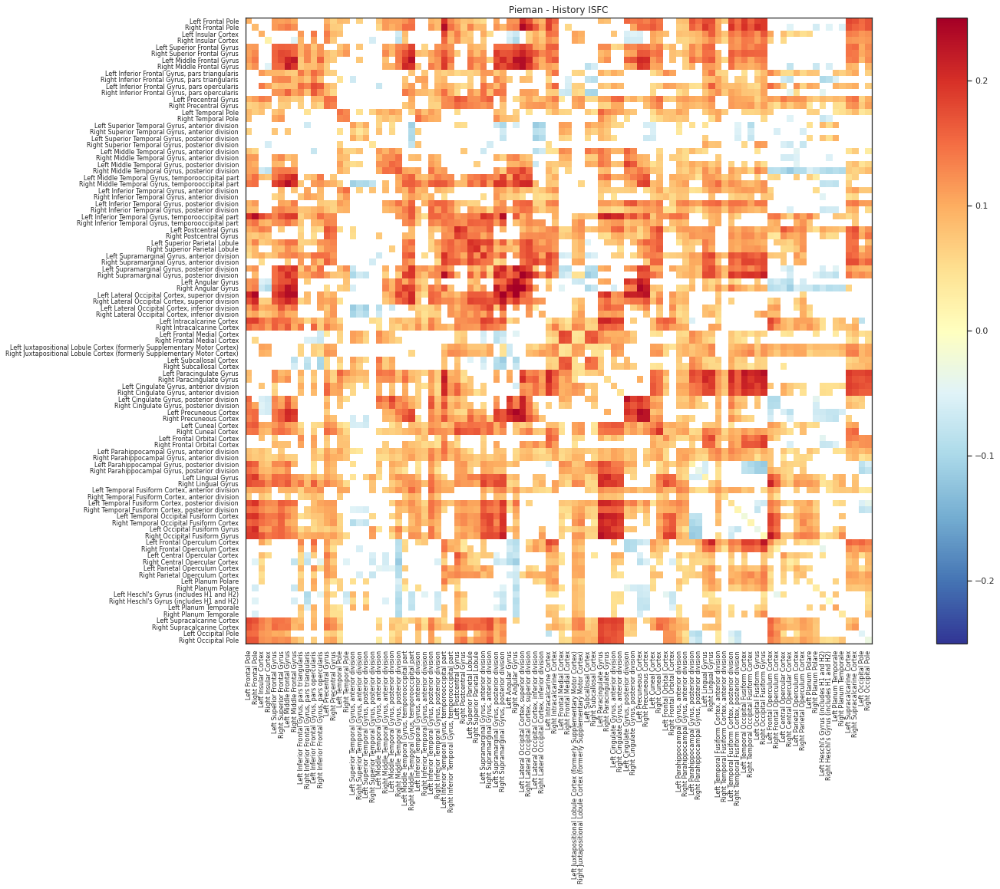

In [424]:
# corrected ISFC map of shared connectivity between pieman and history conditions
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(corrected_pieman_hist_map, interpolation='None', cmap='RdYlBu_r', vmin = -.25, vmax = .25)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("Pieman - History ISFC")
f.colorbar(im,ax=ax);

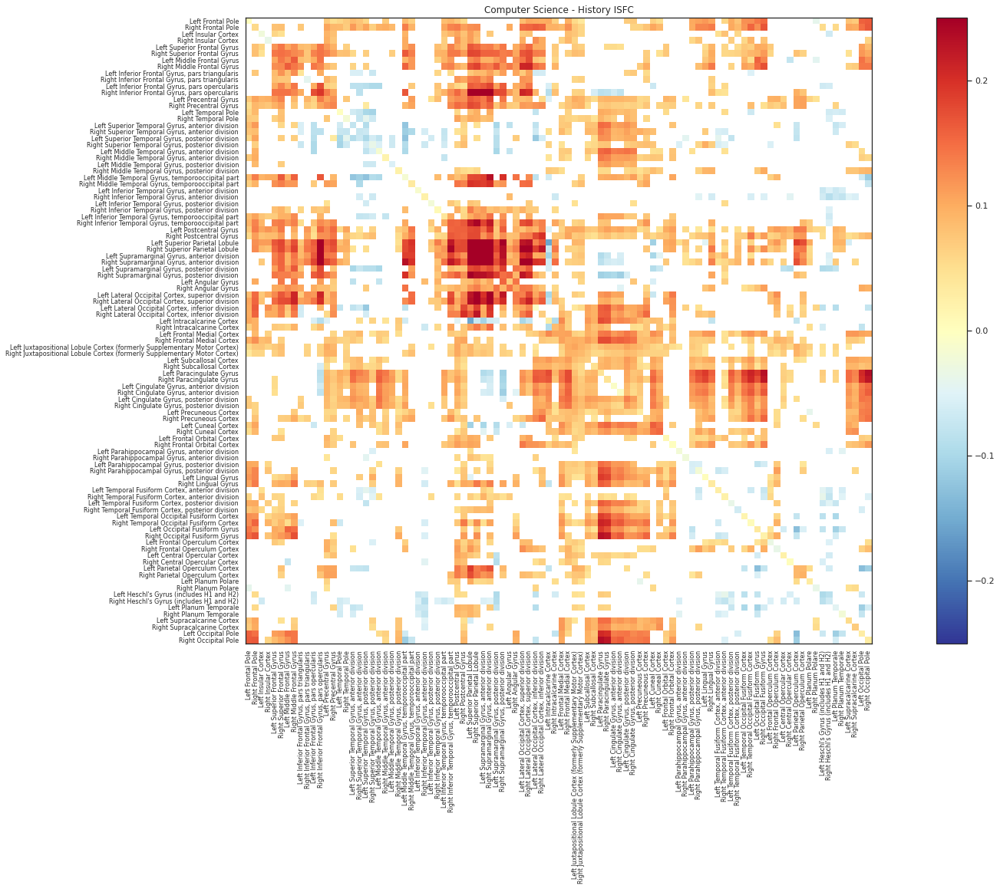

In [426]:
# corrected ISFC map of shared connectivity between computer science and history conditions
f, ax = plt.subplots(figsize=(30,15))
im=ax.imshow(corrected_cos_hist_map, interpolation='None', cmap='RdYlBu_r', vmin = -.25, vmax = .25)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("Computer Science - History ISFC")
f.colorbar(im,ax=ax);

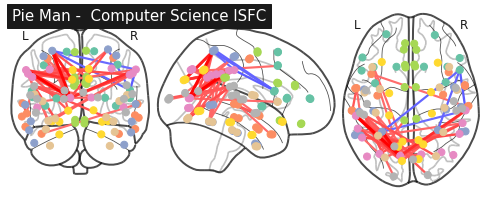

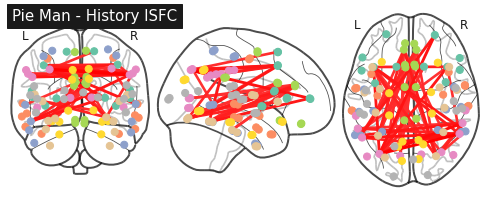

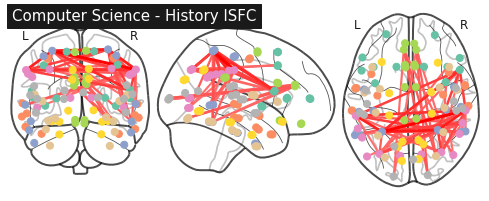

In [628]:
plotting.plot_connectome(corrected_pieman_cos_map, node_coords = parcel_coords, edge_threshold='99%', title ="Pie Man -  Computer Science ISFC")
plotting.plot_connectome(corrected_pieman_hist_map, node_coords = parcel_coords, edge_threshold='99%', title ="Pie Man - History ISFC")
plotting.plot_connectome(corrected_cos_hist_map, node_coords = parcel_coords, edge_threshold='99%', title ="Computer Science - History ISFC")

In [ ]:
# below I am just playing around, showing the correlations between two mean ISFC maps

In [380]:
pieman_cos = np.corrcoef(np.mean(piemanVid_isfc_maps_allsubs, axis = 0)) - np.corrcoef(np.mean(cosVid_isfc_maps_allsubs, axis = 0))

In [550]:
t, p = stats.ttest_ind(np.corrcoef(np.mean(piemanVid_isfc_maps_allsubs, axis = 0)), np.corrcoef(np.mean(cosVid_isfc_maps_allsubs, axis = 0)))

In [391]:
pieman_hist = np.corrcoef(np.mean(piemanVid_isfc_maps_allsubs, axis = 0)) - np.corrcoef(np.mean(histVid_isfc_maps_allsubs, axis = 0))

In [392]:
cos_hist = np.corrcoef(np.mean(cosVid_isfc_maps_allsubs, axis = 0)) - np.corrcoef(np.mean(histVid_isfc_maps_allsubs, axis = 0))

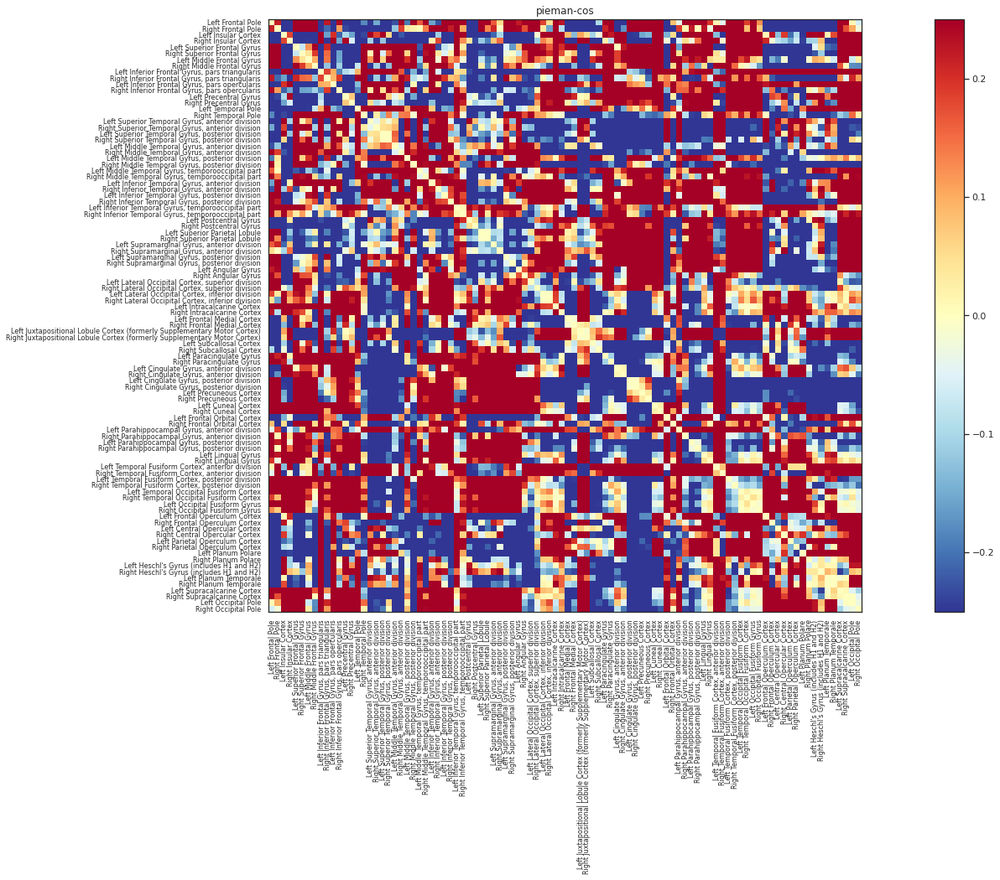

In [390]:
# this is an isfc plot
f, ax = plt.subplots(figsize=(31,13))
im=ax.imshow(pieman_cos, interpolation='None', cmap='RdYlBu_r', vmin = -.25, vmax = .25)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("pieman-cos")
f.colorbar(im,ax=ax);

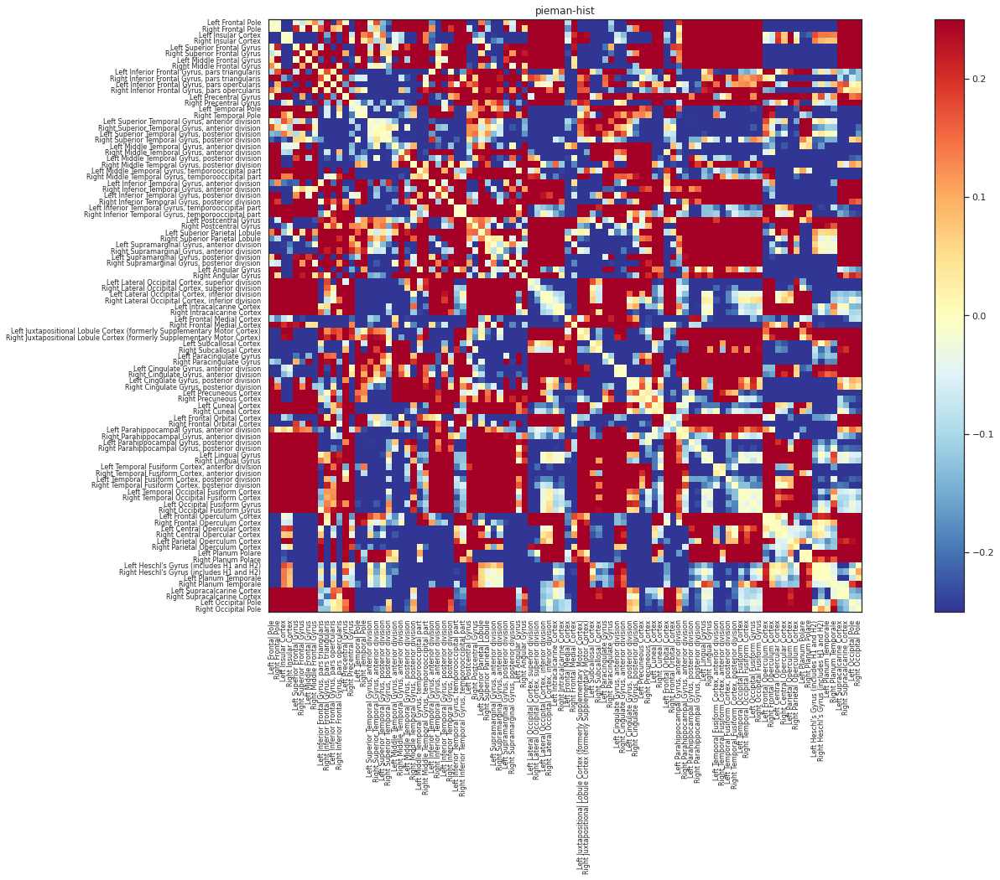

In [393]:
# this is an isfc plot
f, ax = plt.subplots(figsize=(31,13))
im=ax.imshow(pieman_hist, interpolation='None', cmap='RdYlBu_r', vmin = -.25, vmax = .25)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("pieman-hist")
f.colorbar(im,ax=ax);

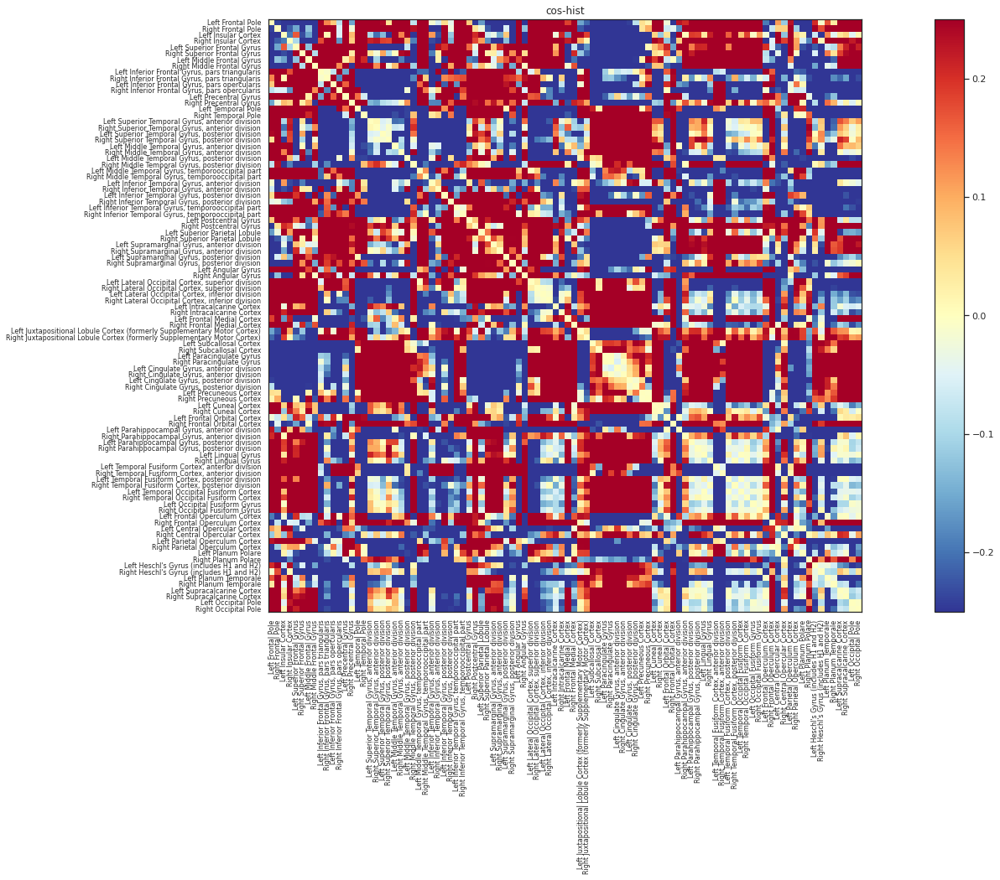

In [394]:
# this is an isfc plot
f, ax = plt.subplots(figsize=(31,13))
im=ax.imshow(cos_hist, interpolation='None', cmap='RdYlBu_r', vmin = -.25, vmax = .25)
ax.set_yticks(range(len(atlas.labels[1:])))
ax.set_yticklabels(atlas.labels[1:], fontsize = 8)
ax.set_xticks(range(len(atlas.labels[1:])))
ax.set_xticklabels(atlas.labels[1:], fontsize = 8,rotation='vertical')
ax.set_title("cos-hist")
f.colorbar(im,ax=ax);

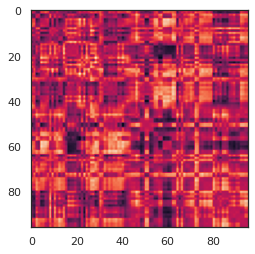

In [402]:
plt.imshow(cos_hist);
plt.imshow(pieman_hist)
plt.imshow(pieman_cos)

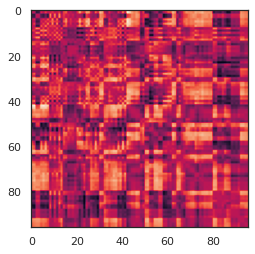

In [400]:
plt.imshow(pieman_hist)

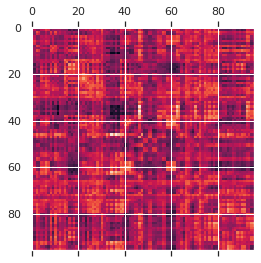

In [511]:
plt.matshow(pieman_cos)